# Classificação de Imagens — Intel Image Classification

**Visão Computacional** · PyTorch + CUDA  
Dataset com **6 classes** de cenas (prédios, floresta, geleira, montanha, mar, rua).


Pastas esperadas na raiz do projeto:
```
seg_train/   

seg_test/   

seg_pred/
```


## Fase 1 — Ambiente e dados

Aqui configuramos a GPU, carregamos as imagens e montamos os loaders de treino, validação e teste. Também contamos quantas imagens existem por classe.


### 1.1 Imports e dependências

In [1]:
import os
import random
from collections import Counter
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.utils.data import DataLoader, Dataset, Subset, random_split
from torchvision import datasets, transforms
from torchvision.utils import make_grid

# Estilo consistente para gráficos (compatível com exportação para GitHub)
plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams.update({
    "figure.figsize": (10, 5),
    "axes.titlesize": 13,
    "axes.labelsize": 11,
})

### 1.2 CUDA e dispositivo

Definimos o `device` (CPU ou GPU). Nas fases seguintes, modelos e batches vão para esse dispositivo.


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

print(f"PyTorch: {torch.__version__}")
print(f"Dispositivo selecionado: {device.upper()}")

if device == "cuda":
    gpu_index = torch.cuda.current_device()
    print(f"GPU: {torch.cuda.get_device_name(gpu_index)}")
    print(f"Capacidade de computação: {torch.cuda.get_device_capability(gpu_index)}")
    props = torch.cuda.get_device_properties(gpu_index)
    print(f"Memória total: {props.total_memory / 1e9:.2f} GB")
    print(f"CUDA / cuDNN: {torch.version.cuda} / {torch.backends.cudnn.version()}")
else:
    print("CUDA indisponível — o treinamento usará CPU (mais lento).")

PyTorch: 2.6.0+cu124
Dispositivo selecionado: CUDA
GPU: NVIDIA GeForce RTX 4060 Ti
Capacidade de computação: (8, 9)
Memória total: 17.18 GB
CUDA / cuDNN: 12.4 / 90100


### 1.3 Hiperparâmetros globais

`SEED`, tamanho da imagem, batch e proporção de validação ficam fixos aqui para facilitar repetir o experimento.


In [3]:
# --- Reprodutibilidade ---
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    # Determinismo parcial (pode reduzir levemente a velocidade na GPU)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# --- Dados ---
BATCH_SIZE = 32
IMAGE_SIZE = 150          # Intel Image Classification usa imagens ~150×150
VAL_RATIO = 0.15          # fração do seg_train reservada para validação

# pin_memory acelera cópia para GPU; num_workers depende do SO
PIN_MEMORY = device == "cuda"
NUM_WORKERS = 0 if os.name == "nt" else min(4, os.cpu_count() or 1)

print(f"BATCH_SIZE={BATCH_SIZE} | IMAGE_SIZE={IMAGE_SIZE} | VAL_RATIO={VAL_RATIO}")
print(f"NUM_WORKERS={NUM_WORKERS} | PIN_MEMORY={PIN_MEMORY}")

BATCH_SIZE=32 | IMAGE_SIZE=150 | VAL_RATIO=0.15
NUM_WORKERS=0 | PIN_MEMORY=True


### 1.4 Caminhos do dataset

Se as pastas não estiverem na mesma pasta do notebook, ajuste `DATA_ROOT`.


In [4]:
# Raiz do projeto / notebook
DATA_ROOT = Path(".").resolve()

TRAIN_DIR = DATA_ROOT / "seg_train"
TEST_DIR = DATA_ROOT / "seg_test"
PRED_DIR = DATA_ROOT / "seg_pred"  # sem rótulos — usado em fases futuras

for name, path in [("treino", TRAIN_DIR), ("teste", TEST_DIR)]:
    if not path.is_dir():
        raise FileNotFoundError(
            f"Pasta de {name} não encontrada: {path.name}/\n"
            "Baixe o dataset do Kaggle e extraia seg_train/ e seg_test/ na pasta do notebook."
        )

print(f"DATA_ROOT: . ({DATA_ROOT.name})")
print(f"Treino:    {TRAIN_DIR.relative_to(DATA_ROOT).as_posix()}/")
print(f"Teste:     {TEST_DIR.relative_to(DATA_ROOT).as_posix()}/")
print(
    f"Predição:  {PRED_DIR.relative_to(DATA_ROOT).as_posix()}/ "
    f"({'ok' if PRED_DIR.is_dir() else 'ausente'})"
)


DATA_ROOT: . (project folder)
Treino:    seg_train/
Teste:     seg_test/
Predição:  seg_pred/ (ok)


### 1.5 Transformações básicas

Por enquanto só redimensionamos, convertemos para tensor e normalizamos (pixels perto de -1 a 1). Augmentation mais forte entra na Fase 3.


In [5]:
IMAGENET_MEAN = (0.5, 0.5, 0.5)
IMAGENET_STD = (0.5, 0.5, 0.5)

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# Mesmas operações determinísticas para val/teste (sem aleatoriedade)
eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print("train_transform:", train_transform)
print("eval_transform: ", eval_transform)

train_transform: Compose(
    Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)
eval_transform:  Compose(
    Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)


### 1.6 Treino, validação e teste

- **Treino + val:** vêm de `seg_train` (85% / 15%, seed fixa).
- **Teste:** `seg_test` separado — só usamos no final, para não “vazar” informação.


In [6]:
class TransformSubset(Dataset):
    """Subset do ImageFolder com transform independente (treino vs. validação)."""

    def __init__(self, subset: Subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, index):
        pil_image, label = self.subset[index]
        if self.transform is not None:
            pil_image = self.transform(pil_image)
        return pil_image, label

    def __len__(self):
        return len(self.subset)


# ImageFolder sem transform — PIL bruta; transforms aplicados por split
full_train_base = datasets.ImageFolder(root=str(TRAIN_DIR), transform=None)

class_names = full_train_base.classes
class_to_idx = full_train_base.class_to_idx
num_classes = len(class_names)

n_total_train = len(full_train_base)
n_val = int(n_total_train * VAL_RATIO)
n_train = n_total_train - n_val

generator = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(
    full_train_base,
    [n_train, n_val],
    generator=generator,
)

train_dataset = TransformSubset(train_subset, transform=train_transform)
val_dataset = TransformSubset(val_subset, transform=eval_transform)

# Teste com transform de avaliação
test_dataset = datasets.ImageFolder(
    root=str(TEST_DIR),
    transform=eval_transform,
)

assert test_dataset.classes == class_names, "Classes de teste divergem do treino!"

print(f"Classes ({num_classes}): {class_names}")
print(f"Mapeamento: {class_to_idx}")
print(f"Treino (após split): {len(train_dataset):,} imagens")
print(f"Validação:           {len(val_dataset):,} imagens")
print(f"Teste:               {len(test_dataset):,} imagens")

Classes (6): ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Mapeamento: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
Treino (após split): 11,929 imagens
Validação:           2,105 imagens
Teste:               3,000 imagens


### 1.7 DataLoaders

Treino com `shuffle`; val e teste sem. No treino, o último batch incompleto é descartado (`drop_last`).


In [7]:
def _make_loader(dataset, shuffle: bool) -> DataLoader:
    return DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        drop_last=shuffle,  # só no treino
    )


train_loader = _make_loader(train_dataset, shuffle=True)
val_loader = _make_loader(val_dataset, shuffle=False)
test_loader = _make_loader(test_dataset, shuffle=False)

print(f"Batches — treino: {len(train_loader)} | val: {len(val_loader)} | teste: {len(test_loader)}")
print(f"Formato de um batch: (tensor [{BATCH_SIZE}, 3, {IMAGE_SIZE}, {IMAGE_SIZE}], rótulos [{BATCH_SIZE}])")

Batches — treino: 372 | val: 66 | teste: 94
Formato de um batch: (tensor [32, 3, 150, 150], rótulos [32])


### 1.8 Estatísticas

Contagem por classe em `seg_train` e `seg_test` para ver se alguma classe tem bem menos imagens.


In [8]:
def count_images_per_class(root: Path) -> Counter:
    """Conta imagens em subpastas de classe (extensões comuns)."""
    exts = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}
    counts = Counter()
    for class_dir in sorted(root.iterdir()):
        if class_dir.is_dir():
            n = sum(1 for p in class_dir.rglob("*") if p.suffix.lower() in exts)
            counts[class_dir.name] = n
    return counts


train_counts = count_images_per_class(TRAIN_DIR)
test_counts = count_images_per_class(TEST_DIR)

n_images_train = sum(train_counts.values())
n_images_test = sum(test_counts.values())
n_images_total_labeled = n_images_train + n_images_test

print("=" * 50)
print("RESUMO DO DATASET")
print("=" * 50)
print(f"Número de classes:     {num_classes}")
print(f"Imagens (seg_train):   {n_images_train:,}")
print(f"Imagens (seg_test):    {n_images_test:,}")
print(f"Total rotulado:        {n_images_total_labeled:,}")
print(f"Split interno val:     {len(val_dataset):,} ({VAL_RATIO:.0%} de seg_train)")
print()
print("Imagens por classe — TREINO (seg_train):")
for cls in class_names:
    print(f"  {cls:12s}: {train_counts[cls]:5d}")
print()
print("Imagens por classe — TESTE (seg_test):")
for cls in class_names:
    print(f"  {cls:12s}: {test_counts[cls]:5d}")

RESUMO DO DATASET
Número de classes:     6
Imagens (seg_train):   14,034
Imagens (seg_test):    3,000
Total rotulado:        17,034
Split interno val:     2,105 (15% de seg_train)

Imagens por classe — TREINO (seg_train):
  buildings   :  2191
  forest      :  2271
  glacier     :  2404
  mountain    :  2512
  sea         :  2274
  street      :  2382

Imagens por classe — TESTE (seg_test):
  buildings   :   437
  forest      :   474
  glacier     :   553
  mountain    :   525
  sea         :   510
  street      :   501


### 1.9 Visualização da distribuição das classes

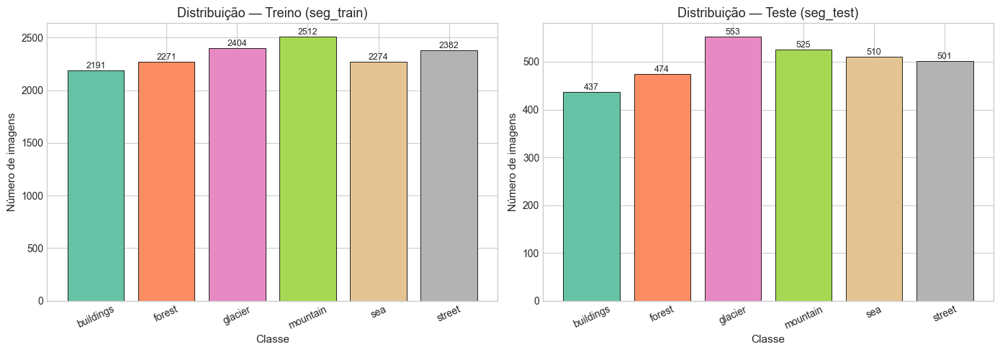

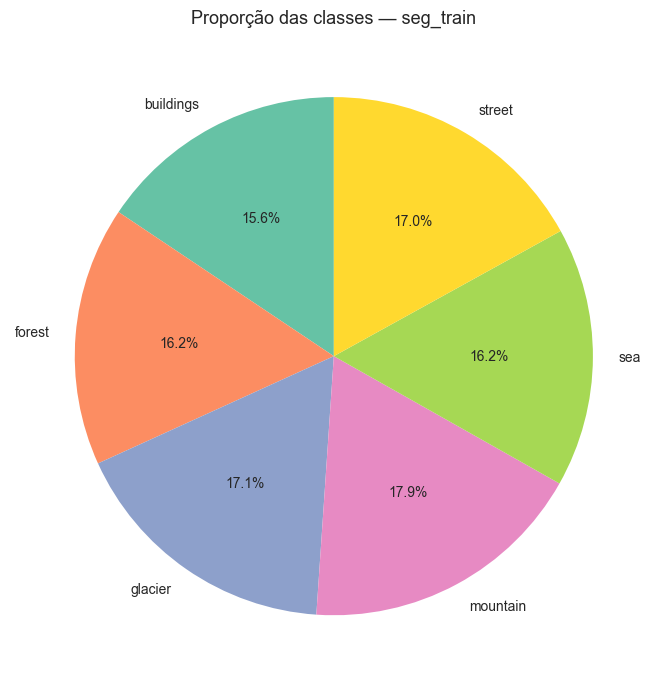

In [9]:
def plot_class_distribution(counts: Counter, title: str, ax=None):
    labels = [c for c in class_names if c in counts]
    values = [counts[c] for c in labels]
    colors = plt.cm.Set2(np.linspace(0, 1, len(labels)))

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5))
    bars = ax.bar(labels, values, color=colors, edgecolor="black", linewidth=0.6)
    ax.set_title(title)
    ax.set_xlabel("Classe")
    ax.set_ylabel("Número de imagens")
    ax.tick_params(axis="x", rotation=25)
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(val),
                ha="center", va="bottom", fontsize=9)
    return ax


fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_class_distribution(train_counts, "Distribuição — Treino (seg_train)", axes[0])
plot_class_distribution(test_counts, "Distribuição — Teste (seg_test)", axes[1])
plt.tight_layout()
plt.show()

# Proporção relativa (treino)
fig, ax = plt.subplots(figsize=(7, 7))
sizes = [train_counts[c] for c in class_names]
ax.pie(sizes, labels=class_names, autopct="%1.1f%%", startangle=90, colors=plt.cm.Set2.colors)
ax.set_title("Proporção das classes — seg_train")
plt.tight_layout()
plt.show()

### 1.10 Exibindo amostra visual




Batch — images: torch.Size([32, 3, 150, 150]), dtype: torch.float32, device: cuda:0
Batch — labels: torch.Size([32]), amostra: [2, 2, 5, 4, 5, 3, 3, 0]


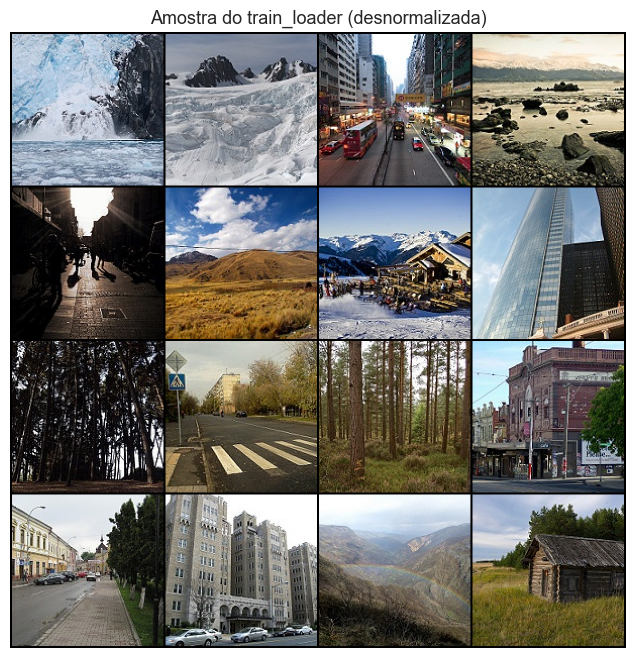

Rótulos (índice:classe): 2:glacier, 2:glacier, 5:street, 4:sea, 5:street, 3:mountain, 3:mountain, 0:buildings, 1:forest, 5:street, 1:forest, 5:street, 5:street, 0:buildings, 3:mountain, 0:buildings


In [10]:
def denormalize(tensor: torch.Tensor) -> torch.Tensor:
    """Reverte Normalize(mean=0.5, std=0.5) para visualização em [0, 1]."""
    mean = torch.tensor(IMAGENET_MEAN, device=tensor.device).view(1, 3, 1, 1)
    std = torch.tensor(IMAGENET_STD, device=tensor.device).view(1, 3, 1, 1)
    return torch.clamp(tensor * std + mean, 0.0, 1.0)


images, labels = next(iter(train_loader))
images = images.to(device, non_blocking=True)
labels = labels.to(device, non_blocking=True)

print(f"Batch — images: {images.shape}, dtype: {images.dtype}, device: {images.device}")
print(f"Batch — labels: {labels.shape}, amostra: {labels[:8].tolist()}")

# Grid para inspeção visual (volta para CPU apenas para matplotlib)
n_show = min(16, images.size(0))
grid = make_grid(denormalize(images[:n_show]).cpu(), nrow=4, padding=2)
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.axis("off")
plt.title("Amostra do train_loader (desnormalizada)")
plt.show()

legenda = ", ".join(f"{i}:{class_names[i]}" for i in labels[:n_show].cpu().tolist())
print(f"Rótulos (índice:classe): {legenda}")

# Boas práticas: liberar tensores temporários da GPU
del images, labels, grid
if device == "cuda":
    torch.cuda.empty_cache()

### 1.11 O que ficou pronto

- 6 classes, ~14 mil imagens de treino e 3 mil de teste.
- Split interno: treino + validação; teste oficial intacto.
- Loaders e normalização prontos para treinar na Fase 4.

`mountain` e `glacier` costumam ter um pouco mais de fotos que `buildings` — vale olhar isso na matriz de confusão depois.


## Fase 2 — Explorando as imagens

Antes de treinar, exibo algumas imagens,um batch do treino e exemplos de cada classe.


### 2.1 Funções de plot

Funções para montar grids a partir dos tensores que já vêm dos loaders.


In [11]:
# Hiperparâmetros só desta fase (visualização)
SAMPLES_PER_CLASS = 6   # imagens exibidas por linha de classe
MAX_BATCHES_SCAN = 400  # limite de segurança ao varrer o loader

# Paleta consistente com a Fase 1
CLASS_COLORS = plt.cm.Set2(np.linspace(0, 1, num_classes))


def collect_samples_per_class(loader, k: int = SAMPLES_PER_CLASS, max_batches: int = MAX_BATCHES_SCAN):
    """Coleta até k tensores desnormalizados por classe a partir de um DataLoader."""
    buckets = {i: [] for i in range(num_classes)}

    for batch_idx, (images, labels) in enumerate(loader):
        images_vis = denormalize(images).cpu()
        for img, label in zip(images_vis, labels):
            idx = int(label)
            if len(buckets[idx]) < k:
                buckets[idx].append(img)
        if all(len(buckets[i]) >= k for i in range(num_classes)):
            break
        if batch_idx + 1 >= max_batches:
            missing = [class_names[i] for i in range(num_classes) if len(buckets[i]) < k]
            raise RuntimeError(f"Não foi possível coletar {k} amostras/classe. Faltam: {missing}")
    return buckets


def show_mixed_batch_grid(images, labels, nrow: int = 8, title: str = "Batch misto"):
    """Grid de um batch com legenda de rótulos corretos abaixo de cada miniatura."""
    images_vis = denormalize(images).cpu()
    n = images_vis.size(0)
    ncol = min(nrow, n)
    nrows = int(np.ceil(n / ncol))

    fig, axes = plt.subplots(nrows, ncol, figsize=(ncol * 1.85, nrows * 2.15))
    axes = np.atleast_2d(axes)

    for i in range(nrows * ncol):
        ax = axes.flat[i]
        ax.axis("off")
        if i >= n:
            continue
        ax.imshow(images_vis[i].permute(1, 2, 0).numpy())
        cls_name = class_names[int(labels[i])]
        ax.set_title(cls_name, fontsize=9, fontweight="bold", color=CLASS_COLORS[int(labels[i])])

    fig.suptitle(title, fontsize=14, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.show()


def show_per_class_gallery(buckets, k: int = SAMPLES_PER_CLASS, title: str = "Galeria por classe"):
    """Matriz: linhas = classes, colunas = amostras; rótulo correto na primeira coluna."""
    fig, axes = plt.subplots(
        num_classes, k,
        figsize=(k * 2.05, num_classes * 2.05),
        squeeze=False,
    )

    for row, cls_idx in enumerate(range(num_classes)):
        cls_name = class_names[cls_idx]
        color = CLASS_COLORS[cls_idx]

        for col in range(k):
            ax = axes[row, col]
            ax.axis("off")
            if col < len(buckets[cls_idx]):
                ax.imshow(buckets[cls_idx][col].permute(1, 2, 0).numpy())
            if col == 0:
                ax.set_ylabel(
                    cls_name,
                    fontsize=11,
                    fontweight="bold",
                    color=color,
                    rotation=0,
                    labelpad=42,
                    va="center",
                )
            if row == 0:
                ax.set_title(f"Amostra {col + 1}", fontsize=9, pad=6)

    fig.suptitle(
        f"{title}\n(rótulo ground-truth — uma linha por classe)",
        fontsize=14,
        fontweight="bold",
        y=1.01,
    )
    plt.tight_layout()
    plt.subplots_adjust(left=0.12)
    plt.show()

### 2.2 Batch misto

Um batch do treino mostra o quão diferentes as imagens da mesma classe podem ser.


Batch carregado via train_loader — shape: torch.Size([32, 3, 150, 150])
Classes presentes neste batch:
  • buildings    (índice 0): 9 imagem(ns)
  • forest       (índice 1): 8 imagem(ns)
  • glacier      (índice 2): 3 imagem(ns)
  • mountain     (índice 3): 5 imagem(ns)
  • sea          (índice 4): 2 imagem(ns)
  • street       (índice 5): 5 imagem(ns)


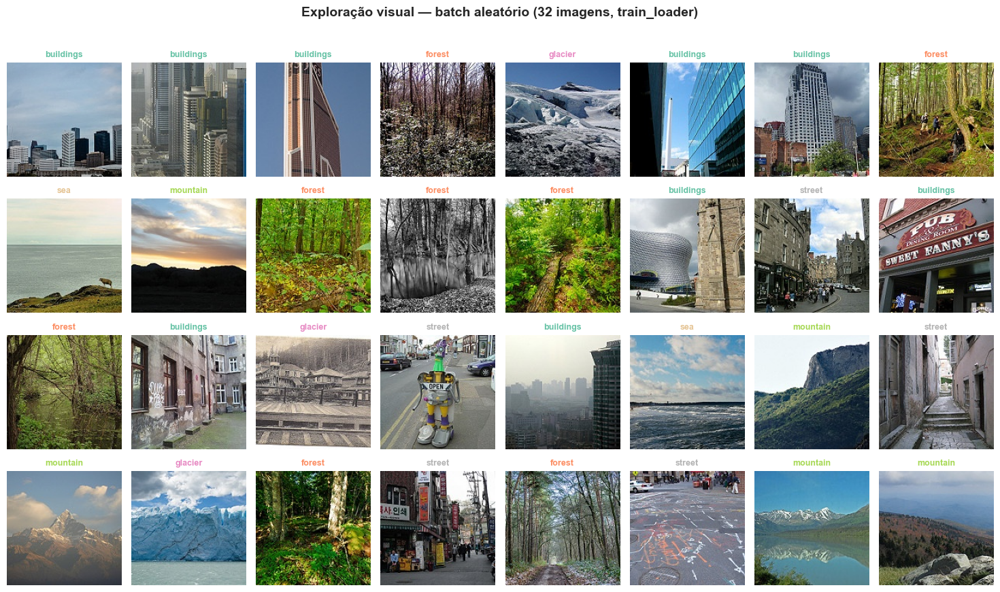

In [12]:
images_batch, labels_batch = next(iter(train_loader))

print(f"Batch carregado via train_loader — shape: {images_batch.shape}")
print("Classes presentes neste batch:")
for cls_idx in sorted(labels_batch.unique().tolist()):
    n_cls = (labels_batch == cls_idx).sum().item()
    print(f"  • {class_names[cls_idx]:12s} (índice {cls_idx}): {n_cls} imagem(ns)")

show_mixed_batch_grid(
    images_batch,
    labels_batch,
    nrow=8,
    title=f"Exploração visual — batch aleatório ({images_batch.size(0)} imagens, train_loader)",
)

del images_batch, labels_batch

### 2.3 Galeria por classe

Uma linha por classe, com várias fotos e o rótulo correto.


Amostras coletadas por classe (val_loader):
  buildings   : 6 imagens
  forest      : 6 imagens
  glacier     : 6 imagens
  mountain    : 6 imagens
  sea         : 6 imagens
  street      : 6 imagens


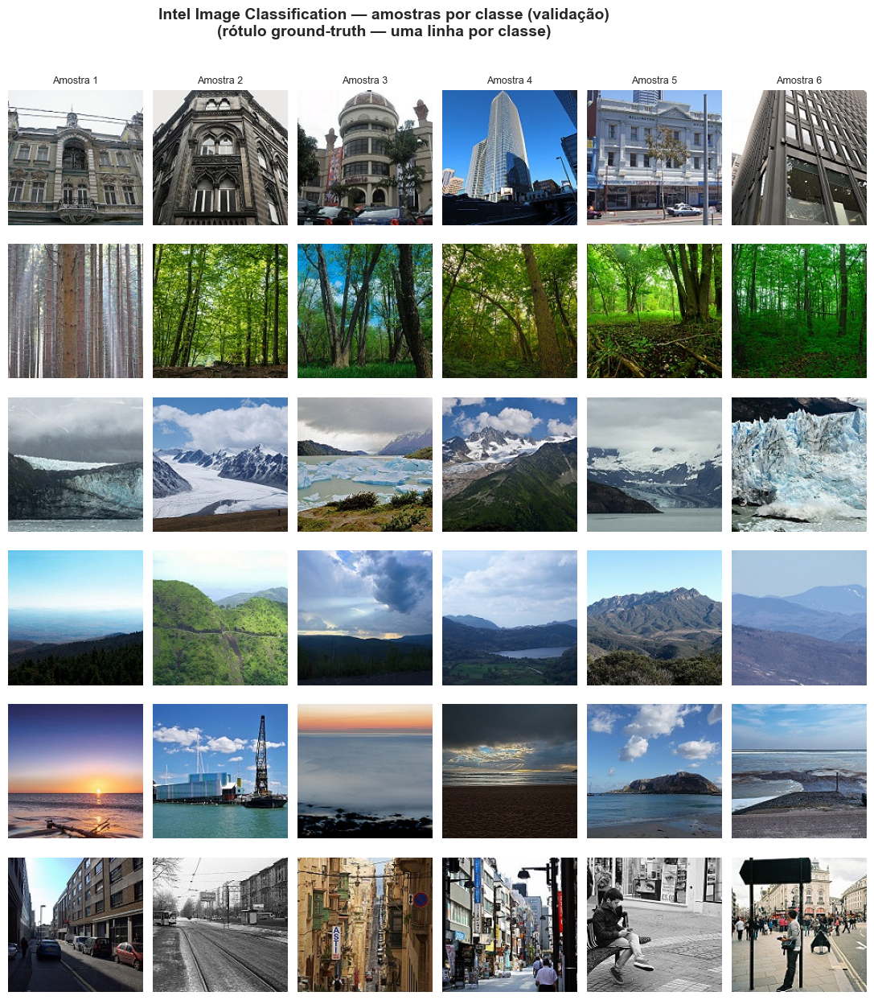

In [13]:
samples_by_class = collect_samples_per_class(val_loader, k=SAMPLES_PER_CLASS)

print("Amostras coletadas por classe (val_loader):")
for cls_idx, cls_name in enumerate(class_names):
    print(f"  {cls_name:12s}: {len(samples_by_class[cls_idx])} imagens")

show_per_class_gallery(
    samples_by_class,
    k=SAMPLES_PER_CLASS,
    title="Intel Image Classification — amostras por classe (validação)",
)

### 2.4 Amostras do teste

Mesmo pipeline de pré-processamento no `seg_test` — conferência visual rápida.


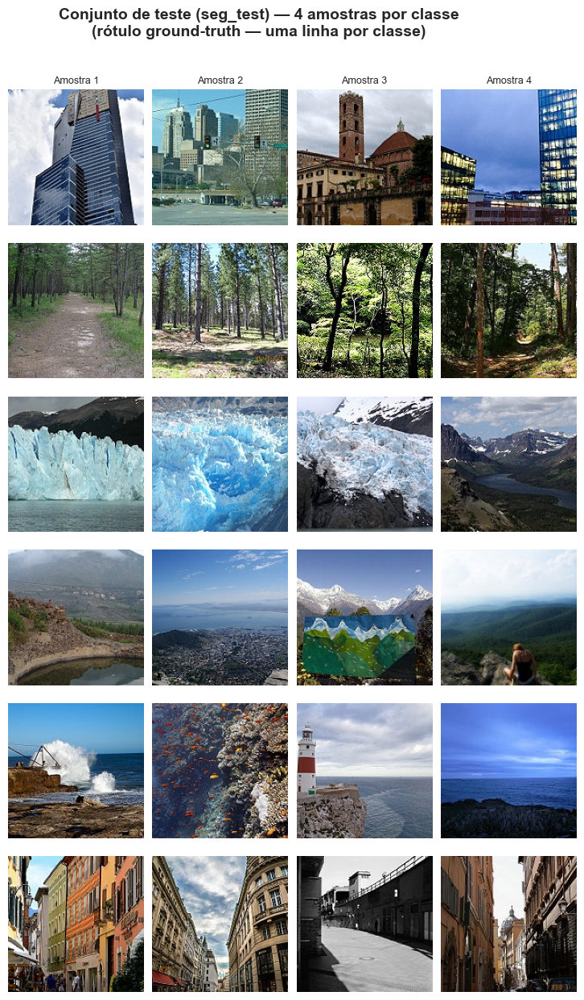

In [14]:
test_samples = collect_samples_per_class(test_loader, k=4, max_batches=MAX_BATCHES_SCAN)

show_per_class_gallery(
    test_samples,
    k=4,
    title="Conjunto de teste (seg_test) — 4 amostras por classe",
)

del samples_by_class, test_samples
if device == "cuda":
    torch.cuda.empty_cache()

### 2.5 Observações

As imagens variam muito dentro da mesma classe.

Alguns pares que são podem ser confundidos durante o treinamento:

glacier ↔ mountain

sea ↔ glacier 

buildings ↔ street



## 3 — Augmentation no treino

Atualizado o transform do treino, recorte, flip, rotação etc. Validação e teste continuam iguais.


### 3.1 Normalização

normalizamos com média e desvio 0.5 (valores ficam por volta de -1 a 1). Mesma lógica da primeira fase.


### 3.2 Pipelines

- **Treino:** `build_train_transform(augment=True)` — com aleatoriedade.
- **Val/teste:** `build_eval_transform()` — sempre a mesma transformação.

No treino usamos recorte aleatório, flip, rotação leve e um pouco de affine.


In [15]:
# --- Hiperparâmetros de augmentation (ajuste fino na Fase 5) ---
AUG_FLIP_P = 0.5
AUG_ROTATION = 20              # graus máximos (sentido horário e anti-horário)
RRC_SCALE = (0.75, 1.0)        # fração da área da imagem no RandomResizedCrop
RRC_RATIO = (0.9, 1.1)
AFFINE_TRANSLATE = (0.08, 0.08)  # fração largura/altura


def build_eval_transform(image_size: int = IMAGE_SIZE) -> transforms.Compose:
    """Pipeline determinístico para validação, teste e inferência."""
    return transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ])


def build_train_transform(
    image_size: int = IMAGE_SIZE,
    augment: bool = True,
) -> transforms.Compose:
    """Pipeline de treino; augmentation opcional (desligada com augment=False)."""
    if not augment:
        return build_eval_transform(image_size)

    return transforms.Compose([
        transforms.RandomResizedCrop(image_size, scale=RRC_SCALE, ratio=RRC_RATIO),
        transforms.RandomHorizontalFlip(p=AUG_FLIP_P),
        transforms.RandomRotation(degrees=AUG_ROTATION),
        transforms.RandomAffine(
            degrees=0,
            translate=AFFINE_TRANSLATE,
            scale=(0.95, 1.05),
            shear=5,
        ),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ])


# Atualiza pipelines globais (compatíveis com denormalize e fases futuras)
train_transform = build_train_transform(augment=True)
eval_transform = build_eval_transform()

print("=== eval_transform (val / test) ===")
print(eval_transform)
print("\n=== train_transform (somente treino) ===")
print(train_transform)

=== eval_transform (val / test) ===
Compose(
    Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)

=== train_transform (somente treino) ===
Compose(
    RandomResizedCrop(size=(150, 150), scale=(0.75, 1.0), ratio=(0.9, 1.1), interpolation=bilinear, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-20.0, 20.0], interpolation=nearest, expand=False, fill=0)
    RandomAffine(degrees=[0.0, 0.0], translate=(0.08, 0.08), scale=(0.95, 1.05), shear=[-5.0, 5.0])
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)


### 3.3 Aplicar nos datasets

Só trocamos o `transform` do treino e recriamos o `train_loader`. Os splits não mudam.


In [16]:
# Augmentation ativo apenas no treino
train_dataset.transform = train_transform
val_dataset.transform = eval_transform  # explícito — sem augmentation

# test_dataset já usa eval_transform desde a Fase 1; garante referência atualizada
test_dataset.transform = eval_transform

# Recria somente o loader de treino (val_loader e test_loader inalterados na lógica)
train_loader = _make_loader(train_dataset, shuffle=True)

print("Pipelines aplicados:")
print(f"  train_dataset → augment=True  | {len(train_dataset):,} amostras")
print(f"  val_dataset   → eval_transform | {len(val_dataset):,} amostras")
print(f"  test_dataset  → eval_transform | {len(test_dataset):,} amostras")
print(f"\ntrain_loader: {len(train_loader)} batches (batch_size={BATCH_SIZE})")
print("val_loader e test_loader: inalterados (transform determinístico).")

Pipelines aplicados:
  train_dataset → augment=True  | 11,929 amostras
  val_dataset   → eval_transform | 2,105 amostras
  test_dataset  → eval_transform | 3,000 amostras

train_loader: 372 batches (batch_size=32)
val_loader e test_loader: inalterados (transform determinístico).


### 3.4 Ver augmentation

Mesma foto original várias vezes com augmentations diferentes, exibindo como o modelo enxerga a cada época.


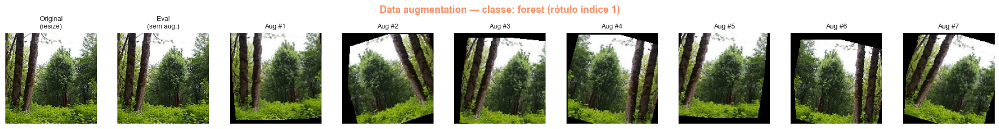

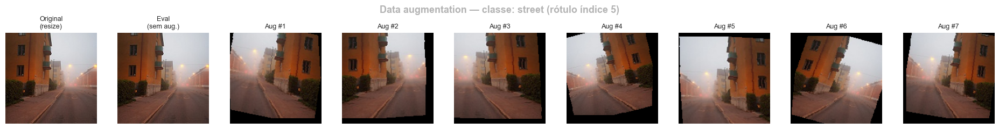

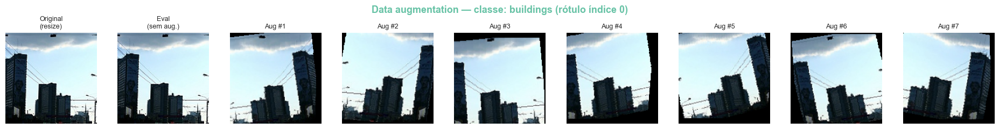

In [17]:
# Apenas redimensiona para exibir a referência (sem normalizar)
_display_resize = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
])

N_AUG_SHOW = 7  # colunas de augmentations aleatórias

# Fallback se a Fase 2 não tiver sido executada nesta sessão
if "CLASS_COLORS" not in globals():
    CLASS_COLORS = plt.cm.Set2(np.linspace(0, 1, num_classes))


def _tensor_for_plot(tensor: torch.Tensor, normalized: bool) -> np.ndarray:
    if normalized:
        tensor = denormalize(tensor.unsqueeze(0)).squeeze(0)
    return tensor.permute(1, 2, 0).numpy()


def show_augmentation_comparison(pil_image, label_idx: int, n_aug: int = N_AUG_SHOW):
    """Compara imagem de referência, avaliação determinística e N augmentations."""
    fig, axes = plt.subplots(1, n_aug + 2, figsize=((n_aug + 2) * 2.1, 2.4))

    panels = [
        ("Original\n(resize)", _display_resize(pil_image), False),
        ("Eval\n(sem aug.)", eval_transform(pil_image), True),
    ]
    panels += [
        (f"Aug #{i + 1}", train_transform(pil_image), True) for i in range(n_aug)
    ]

    cls_name = class_names[label_idx]
    color = CLASS_COLORS[label_idx]

    for ax, (title, tensor_img, is_normalized) in zip(axes, panels):
        ax.imshow(_tensor_for_plot(tensor_img, is_normalized))
        ax.set_title(title, fontsize=9)
        ax.axis("off")

    fig.suptitle(
        f"Data augmentation — classe: {cls_name} (rótulo índice {label_idx})",
        fontsize=13,
        fontweight="bold",
        color=color,
    )
    plt.tight_layout()
    plt.show()


# Três classes distintas para ilustrar variabilidade
preview_indices = [0, len(train_subset) // 3, len(train_subset) // 2]
for idx in preview_indices:
    pil_img, label = train_subset[idx]
    show_augmentation_comparison(pil_img, int(label))

### 3.5 Batch após augmentation

Confirma que o loader de treino ainda entrega tensores no formato esperado.


train_loader (com augmentation) — shape: torch.Size([32, 3, 150, 150])
Faixa aproximada dos pixels (normalizados): [-1.00, 1.00]


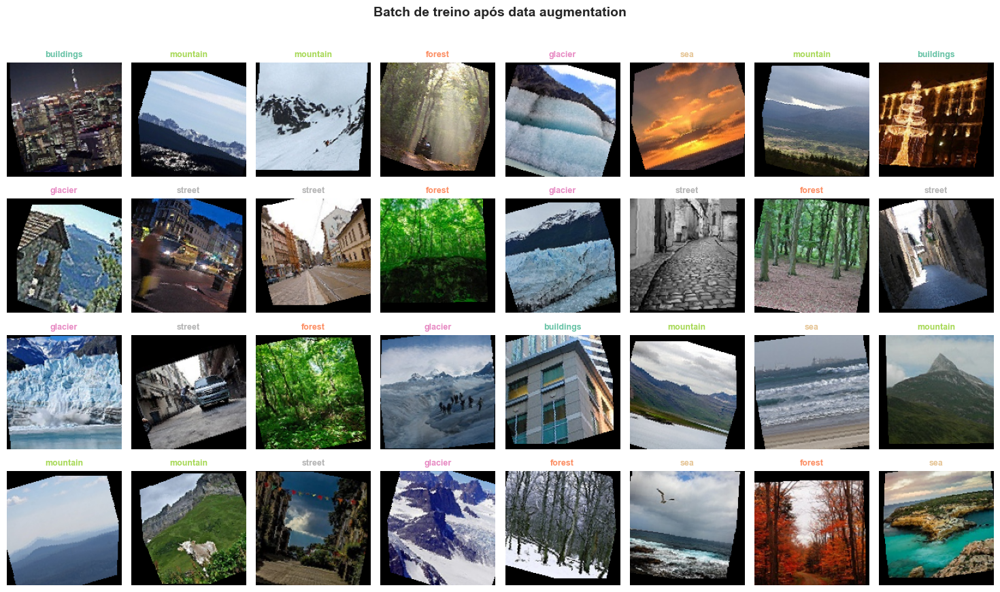

In [18]:
images_aug, labels_aug = next(iter(train_loader))

print(f"train_loader (com augmentation) — shape: {images_aug.shape}")
print(f"Faixa aproximada dos pixels (normalizados): "
      f"[{images_aug.min():.2f}, {images_aug.max():.2f}]")

show_mixed_batch_grid(
    images_aug,
    labels_aug,
    nrow=8,
    title="Batch de treino após data augmentation",
)

del images_aug, labels_aug
if device == "cuda":
    torch.cuda.empty_cache()

## 4 — CNN baseline

Rede simples (3 blocos conv + FC) para ter uma referência. 

### 4.1 Hiperparâmetros de treino (baseline)

In [19]:
import torch.nn as nn
from copy import deepcopy

# --- Treino da baseline (ajuste fino permitido) ---
EPOCHS_BASELINE = 15
LR_BASELINE = 1e-3
WEIGHT_DECAY = 1e-4
DROPOUT_BASELINE = 0.5
HIDDEN_UNITS = 256

# Loader de treino sem shuffle/drop_last — métricas estáveis no conjunto de treino
train_eval_loader = _make_loader(train_dataset, shuffle=False)

criterion = nn.CrossEntropyLoss()
print(f"Loss: CrossEntropyLoss | Otimizador: Adam (lr={LR_BASELINE}, weight_decay={WEIGHT_DECAY})")
print(f"Épocas: {EPOCHS_BASELINE} | Dispositivo: {device}")

Loss: CrossEntropyLoss | Otimizador: Adam (lr=0.001, weight_decay=0.0001)
Épocas: 15 | Dispositivo: cuda


### 4.2 Arquitetura `BaselineCNN`

Três convoluções (32 → 64 → 128), pooling e duas camadas densas no final. Inspirada em redes clássicas, mas enxuta.


In [20]:
class BaselineCNN(nn.Module):
    """CNN compacta: 3 blocos Conv+Pool, FC oculta e saída multiclasse."""

    def __init__(
        self,
        num_classes: int = num_classes,
        image_size: int = IMAGE_SIZE,
        dropout: float = DROPOUT_BASELINE,
        hidden_units: int = HIDDEN_UNITS,
    ):
        super().__init__()

        # Poucos filtros por bloco — capacidade deliberadamente limitada
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        with torch.no_grad():
            dummy = torch.zeros(1, 3, image_size, image_size)
            n_flat = self.features(dummy).view(1, -1).size(1)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(n_flat, hidden_units),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(hidden_units, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)


def count_parameters(model: nn.Module) -> int:
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


baseline_model = BaselineCNN().to(device)
optimizer_baseline = torch.optim.Adam(
    baseline_model.parameters(),
    lr=LR_BASELINE,
    weight_decay=WEIGHT_DECAY,
)

print(baseline_model)
print(f"\nParâmetros treináveis: {count_parameters(baseline_model):,}")
print(f"Entrada esperada: (N, 3, {IMAGE_SIZE}, {IMAGE_SIZE}) → saída (N, {num_classes})")

BaselineCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=41472, out_features=256, bias=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=256, out_features=6, bias=True)
  )
)

Parâmetros treináveis: 10,711,878
Entrada esperada: (N, 3, 150, 150) → saída (N, 6)


### 4.3 Treino e validação

Funções `train_one_epoch` e `evaluate_epoch` reutilizadas nas próximas fases.


In [21]:
def _accuracy(logits: torch.Tensor, targets: torch.Tensor) -> float:
  """Acurácia top-1 em percentual."""
  preds = logits.argmax(dim=1)
  return 100.0 * (preds == targets).sum().item() / targets.size(0)


def train_one_epoch(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    device: str,
) -> tuple[float, float]:
    model.train()
    running_loss = 0.0
    running_acc = 0.0
    n_batches = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        logits = model(images)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        running_acc += _accuracy(logits, labels)
        n_batches += 1

    return running_loss / n_batches, running_acc / n_batches


@torch.no_grad()
def evaluate_epoch(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    device: str,
) -> tuple[float, float]:
    model.eval()
    running_loss = 0.0
    running_acc = 0.0
    n_batches = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = model(images)
        loss = criterion(logits, labels)

        running_loss += loss.item()
        running_acc += _accuracy(logits, labels)
        n_batches += 1

    return running_loss / n_batches, running_acc / n_batches

### 4.4 Loop de treino — histórico por época

In [22]:
history_baseline = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": [],
}

best_val_acc = 0.0
best_state = None

for epoch in range(1, EPOCHS_BASELINE + 1):
    train_loss, train_acc = train_one_epoch(
        baseline_model, train_loader, criterion, optimizer_baseline, device
    )
    val_loss, val_acc = evaluate_epoch(
        baseline_model, val_loader, criterion, device
    )

    history_baseline["train_loss"].append(train_loss)
    history_baseline["val_loss"].append(val_loss)
    history_baseline["train_acc"].append(train_acc)
    history_baseline["val_acc"].append(val_acc)

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_state = deepcopy(baseline_model.state_dict())

    print(
        f"Época [{epoch:02d}/{EPOCHS_BASELINE}] "
        f"| loss treino: {train_loss:.4f} | acc treino: {train_acc:.2f}% "
        f"| loss val: {val_loss:.4f} | acc val: {val_acc:.2f}%"
    )

# Restaura melhor checkpoint pela validação
if best_state is not None:
    baseline_model.load_state_dict(best_state)
    print(f"\nMelhor acurácia de validação: {best_val_acc:.2f}% (pesos restaurados)")

if device == "cuda":
    torch.cuda.empty_cache()

Época [01/15] | loss treino: 1.1192 | acc treino: 55.95% | loss val: 0.8347 | acc val: 67.49%
Época [02/15] | loss treino: 0.8721 | acc treino: 67.82% | loss val: 0.6872 | acc val: 72.53%
Época [03/15] | loss treino: 0.7475 | acc treino: 72.82% | loss val: 0.5716 | acc val: 78.16%
Época [04/15] | loss treino: 0.6765 | acc treino: 75.34% | loss val: 0.5344 | acc val: 80.37%
Época [05/15] | loss treino: 0.6230 | acc treino: 77.47% | loss val: 0.5969 | acc val: 78.30%
Época [06/15] | loss treino: 0.5984 | acc treino: 78.68% | loss val: 0.4960 | acc val: 82.80%
Época [07/15] | loss treino: 0.5618 | acc treino: 79.62% | loss val: 0.4782 | acc val: 83.00%
Época [08/15] | loss treino: 0.5522 | acc treino: 79.90% | loss val: 0.4938 | acc val: 82.88%
Época [09/15] | loss treino: 0.5491 | acc treino: 80.80% | loss val: 0.5321 | acc val: 80.59%
Época [10/15] | loss treino: 0.5204 | acc treino: 81.49% | loss val: 0.5016 | acc val: 81.48%
Época [11/15] | loss treino: 0.5138 | acc treino: 81.93% | l

### 4.5 Curvas de *loss* e *accuracy*

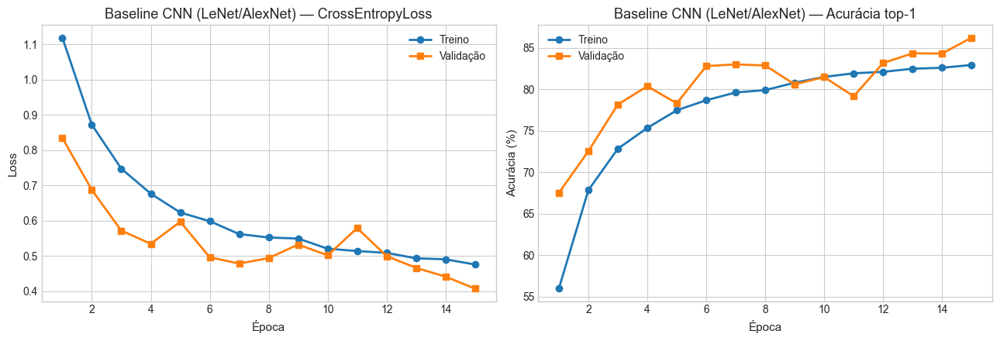

In [23]:
def plot_training_history(history: dict, title: str = "Baseline CNN"):
    epochs = range(1, len(history["train_loss"]) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    axes[0].plot(epochs, history["train_loss"], "o-", label="Treino", linewidth=2)
    axes[0].plot(epochs, history["val_loss"], "s-", label="Validação", linewidth=2)
    axes[0].set_xlabel("Época")
    axes[0].set_ylabel("Loss")
    axes[0].set_title(f"{title} — CrossEntropyLoss")
    axes[0].legend()

    axes[1].plot(epochs, history["train_acc"], "o-", label="Treino", linewidth=2)
    axes[1].plot(epochs, history["val_acc"], "s-", label="Validação", linewidth=2)
    axes[1].set_xlabel("Época")
    axes[1].set_ylabel("Acurácia (%)")
    axes[1].set_title(f"{title} — Acurácia top-1")
    axes[1].legend()

    plt.tight_layout()
    plt.show()


plot_training_history(history_baseline, title="Baseline CNN (LeNet/AlexNet)")

### 4.6 Avaliação — treino, validação e teste

In [24]:
@torch.no_grad()
def evaluate_split(model, loader, criterion, device, split_name: str):
    loss, acc = evaluate_epoch(model, loader, criterion, device)
    print(f"{split_name:12s} | loss: {loss:.4f} | acurácia: {acc:.2f}%")
    return loss, acc


print("=" * 55)
print("Avaliação final — BaselineCNN (melhor época na validação)")
print("=" * 55)

baseline_metrics = {}
baseline_metrics["train"] = evaluate_split(
    baseline_model, train_eval_loader, criterion, device, "Treino"
)
baseline_metrics["val"] = evaluate_split(
    baseline_model, val_loader, criterion, device, "Validação"
)
baseline_metrics["test"] = evaluate_split(
    baseline_model, test_loader, criterion, device, "Teste"
)

# Resumo tabular
print("\nResumo:")
for split, (loss, acc) in baseline_metrics.items():
    print(f"  {split:10s} → acc {acc:6.2f}% | loss {loss:.4f}")

if device == "cuda":
    torch.cuda.empty_cache()

Avaliação final — BaselineCNN (melhor época na validação)
Treino       | loss: 0.3960 | acurácia: 86.03%
Validação    | loss: 0.4072 | acurácia: 86.24%
Teste        | loss: 0.4161 | acurácia: 85.84%

Resumo:
  train      → acc  86.03% | loss 0.3960
  val        → acc  86.24% | loss 0.4072
  test       → acc  85.84% | loss 0.4161


## Fase 5 — CNN estilo VGG

Rede mais profunda: várias conv 3×3, BatchNorm e pooling adaptativo no final. A ideia é capturar melhor textura e detalhes que a baseline perde.


### 5.1 Hiperparâmetros (VGG-like)

In [25]:
import time

EPOCHS_VGG = 15
LR_VGG = 5e-4          # taxa um pouco menor — rede mais profunda
WEIGHT_DECAY_VGG = 1e-4
DROPOUT_VGG = 0.5
VGG_CHANNELS = (64, 128, 256, 512)  # crescimento progressivo de filtros

print(f"VGG-like | épocas={EPOCHS_VGG} | lr={LR_VGG} | canais={VGG_CHANNELS}")
print(f"Loss: CrossEntropyLoss (reutilizada) | Otimizador: Adam")

VGG-like | épocas=15 | lr=0.0005 | canais=(64, 128, 256, 512)
Loss: CrossEntropyLoss (reutilizada) | Otimizador: Adam


### 5.2 Arquitetura `VGGLikeCNN`

Quatro blocos de convolução (canais 64 → 512), depois média global e classificador com dropout.


In [26]:
class VGGLikeCNN(nn.Module):
    """VGG compacta para 150×150: blocos duplos 3×3 + BatchNorm + MaxPool."""

    def __init__(
        self,
        num_classes: int = num_classes,
        channels: tuple = VGG_CHANNELS,
        dropout: float = DROPOUT_VGG,
        fc_hidden: int = 256,
    ):
        super().__init__()

        layers = []
        in_ch = 3
        for out_ch in channels:
            layers.extend([
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
            ])
            in_ch = out_ch

        self.features = nn.Sequential(*layers)

        # Pool global → vetor 512-D (último canal) sem cálculo manual de tamanho
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(channels[-1], fc_hidden),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(fc_hidden, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)


vgg_model = VGGLikeCNN().to(device)
optimizer_vgg = torch.optim.Adam(
    vgg_model.parameters(),
    lr=LR_VGG,
    weight_decay=WEIGHT_DECAY_VGG,
)

n_params_baseline = count_parameters(baseline_model)
n_params_vgg = count_parameters(vgg_model)

print(vgg_model)
print(f"\nParâmetros treináveis (VGG-like): {n_params_vgg:,}")
print(f"Parâmetros treináveis (baseline): {n_params_baseline:,}")
print(f"Razão VGG / baseline: {n_params_vgg / n_params_baseline:.2f}×")

VGGLikeCNN(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(1

### 5.3 Treinamento

Mesmo loop da baseline, registrado o tempo de treino para comparar depois.


In [27]:
history_vgg = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": [],
}

best_val_acc_vgg = 0.0
best_state_vgg = None

t0 = time.perf_counter()

for epoch in range(1, EPOCHS_VGG + 1):
    train_loss, train_acc = train_one_epoch(
        vgg_model, train_loader, criterion, optimizer_vgg, device
    )
    val_loss, val_acc = evaluate_epoch(
        vgg_model, val_loader, criterion, device
    )

    history_vgg["train_loss"].append(train_loss)
    history_vgg["val_loss"].append(val_loss)
    history_vgg["train_acc"].append(train_acc)
    history_vgg["val_acc"].append(val_acc)

    if val_acc > best_val_acc_vgg:
        best_val_acc_vgg = val_acc
        best_state_vgg = deepcopy(vgg_model.state_dict())

    print(
        f"Época [{epoch:02d}/{EPOCHS_VGG}] "
        f"| loss treino: {train_loss:.4f} | acc treino: {train_acc:.2f}% "
        f"| loss val: {val_loss:.4f} | acc val: {val_acc:.2f}%"
    )

training_time_vgg = time.perf_counter() - t0

if best_state_vgg is not None:
    vgg_model.load_state_dict(best_state_vgg)
    print(f"\nMelhor acurácia de validação (VGG): {best_val_acc_vgg:.2f}%")
print(f"Tempo total de treino (VGG-like): {training_time_vgg:.1f} s")

if device == "cuda":
    torch.cuda.empty_cache()

Época [01/15] | loss treino: 1.0588 | acc treino: 57.13% | loss val: 0.7966 | acc val: 71.15%
Época [02/15] | loss treino: 0.7923 | acc treino: 70.26% | loss val: 0.6976 | acc val: 73.80%
Época [03/15] | loss treino: 0.6901 | acc treino: 74.82% | loss val: 0.6841 | acc val: 74.45%
Época [04/15] | loss treino: 0.6268 | acc treino: 77.50% | loss val: 1.2433 | acc val: 61.13%
Época [05/15] | loss treino: 0.5930 | acc treino: 78.86% | loss val: 0.5831 | acc val: 80.32%
Época [06/15] | loss treino: 0.5576 | acc treino: 80.05% | loss val: 0.4853 | acc val: 83.90%
Época [07/15] | loss treino: 0.5500 | acc treino: 80.60% | loss val: 0.5471 | acc val: 81.39%
Época [08/15] | loss treino: 0.5149 | acc treino: 81.46% | loss val: 0.7972 | acc val: 75.04%
Época [09/15] | loss treino: 0.4937 | acc treino: 82.76% | loss val: 0.4216 | acc val: 85.07%
Época [10/15] | loss treino: 0.4887 | acc treino: 82.68% | loss val: 0.4957 | acc val: 82.79%
Época [11/15] | loss treino: 0.4736 | acc treino: 83.02% | l

### 5.4 Curvas de treino — VGG-like e comparação com baseline

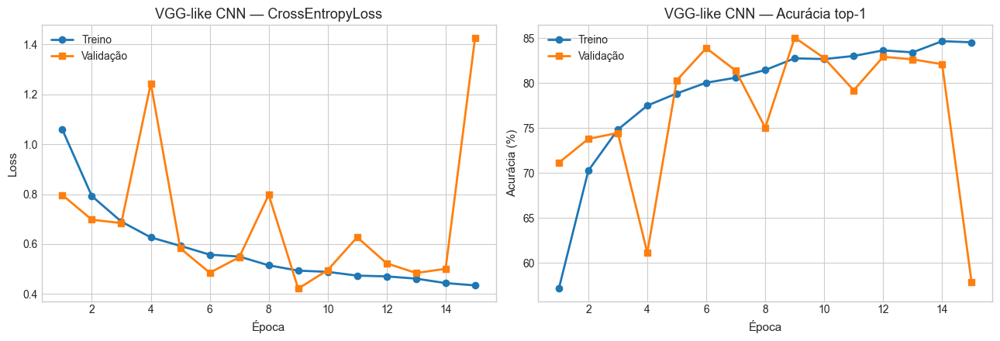

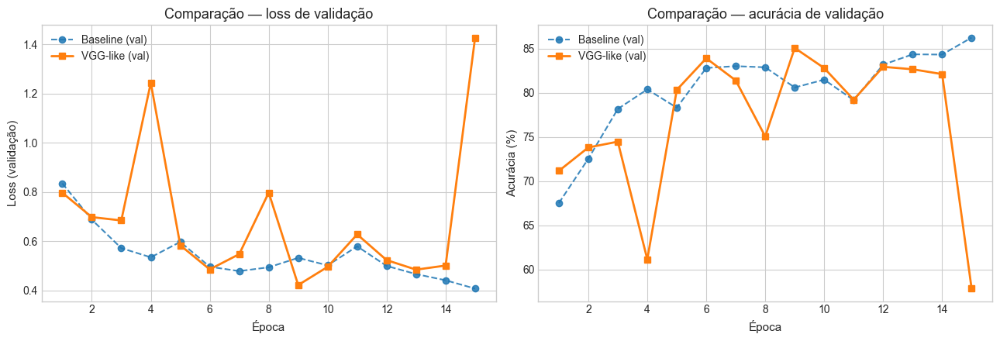

In [28]:
plot_training_history(history_vgg, title="VGG-like CNN")


def plot_models_comparison(
    history_a: dict,
    history_b: dict,
    name_a: str = "Baseline",
    name_b: str = "VGG-like",
):
    """Sobrepõe curvas de loss e accuracy de dois modelos."""
    epochs = range(1, len(history_a["train_loss"]) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    axes[0].plot(epochs, history_a["val_loss"], "o--", label=f"{name_a} (val)", alpha=0.85)
    axes[0].plot(epochs, history_b["val_loss"], "s-", label=f"{name_b} (val)", linewidth=2)
    axes[0].set_xlabel("Época")
    axes[0].set_ylabel("Loss (validação)")
    axes[0].set_title("Comparação — loss de validação")
    axes[0].legend()

    axes[1].plot(epochs, history_a["val_acc"], "o--", label=f"{name_a} (val)", alpha=0.85)
    axes[1].plot(epochs, history_b["val_acc"], "s-", label=f"{name_b} (val)", linewidth=2)
    axes[1].set_xlabel("Época")
    axes[1].set_ylabel("Acurácia (%)")
    axes[1].set_title("Comparação — acurácia de validação")
    axes[1].legend()

    plt.tight_layout()
    plt.show()


plot_models_comparison(history_baseline, history_vgg)

### 5.5 Avaliação — treino, validação e teste

In [29]:
print("=" * 55)
print("Avaliação final — VGGLikeCNN")
print("=" * 55)

vgg_metrics = {}
vgg_metrics["train"] = evaluate_split(
    vgg_model, train_eval_loader, criterion, device, "Treino"
)
vgg_metrics["val"] = evaluate_split(
    vgg_model, val_loader, criterion, device, "Validação"
)
vgg_metrics["test"] = evaluate_split(
    vgg_model, test_loader, criterion, device, "Teste"
)

if device == "cuda":
    torch.cuda.empty_cache()

Avaliação final — VGGLikeCNN
Treino       | loss: 0.4129 | acurácia: 85.26%
Validação    | loss: 0.4216 | acurácia: 85.07%
Teste        | loss: 0.4296 | acurácia: 84.14%


### 5.6 Comparação quantitativa com a baseline

Split        Baseline acc      VGG acc     Δ (pp)
--------------------------------------------------
train              86.03%       85.26%     -0.78
val                86.24%       85.07%     -1.17
test               85.84%       84.14%     -1.70
--------------------------------------------------
Parâmetros: baseline 10,711,878 | VGG 4,822,086 (0.45×)
Tempo treino VGG (esta execução): 1022.5 s

Ganho no teste (VGG − baseline): -1.70 p.p.


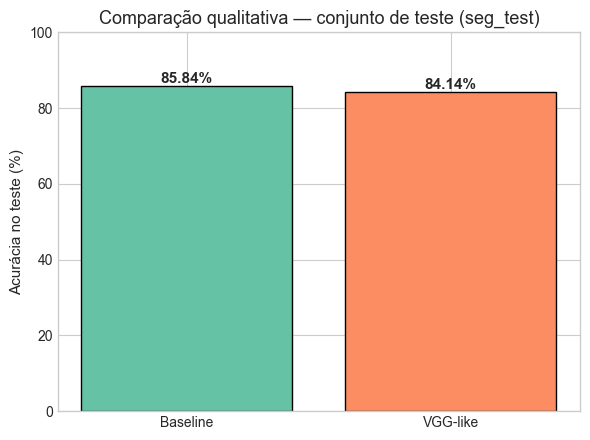

In [30]:
def print_comparison_table(baseline_m, vgg_m, n_base, n_vgg, t_vgg=None):
    """Tabela resumo: acurácia, parâmetros e ganho no teste."""
    splits = ["train", "val", "test"]
    print(f"{'Split':<10} {'Baseline acc':>14} {'VGG acc':>12} {'Δ (pp)':>10}")
    print("-" * 50)
    for s in splits:
        acc_b = baseline_m[s][1]
        acc_v = vgg_m[s][1]
        delta = acc_v - acc_b
        print(f"{s:<10} {acc_b:>13.2f}% {acc_v:>11.2f}% {delta:>+9.2f}")
    print("-" * 50)
    print(f"Parâmetros: baseline {n_base:,} | VGG {n_vgg:,} ({n_vgg/n_base:.2f}×)")
    if t_vgg is not None:
        print(f"Tempo treino VGG (esta execução): {t_vgg:.1f} s")
    test_gain = vgg_m["test"][1] - baseline_m["test"][1]
    print(f"\nGanho no teste (VGG − baseline): {test_gain:+.2f} p.p.")


print_comparison_table(
    baseline_metrics,
    vgg_metrics,
    n_params_baseline,
    n_params_vgg,
    training_time_vgg,
)

# Gráfico de barras — acurácia no teste
labels_cmp = ["Baseline", "VGG-like"]
test_accs = [baseline_metrics["test"][1], vgg_metrics["test"][1]]
colors_cmp = ["#66c2a5", "#fc8d62"]

fig, ax = plt.subplots(figsize=(6, 4.5))
bars = ax.bar(labels_cmp, test_accs, color=colors_cmp, edgecolor="black")
ax.set_ylabel("Acurácia no teste (%)")
ax.set_title("Comparação qualitativa — conjunto de teste (seg_test)")
ax.set_ylim(0, 100)
for bar, acc in zip(bars, test_accs):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.8,
            f"{acc:.2f}%", ha="center", fontsize=11, fontweight="bold")
plt.tight_layout()
plt.show()

### 5.7 Observações

- Mais camadas conv costumam ajudar a identificar imagens de pares mais complexos que podem gerar resultados errados, como sea vs glacier.



## 6 — `AdvancedIntelCNN`

Junta ideias de AlexNet (stem), VGG (blocos) e ResNet (atalhos residuais).


### 6.1 O que tem na rede

- **Stem:** conv maior no início para reduzir tamanho cedo.
- **Blocos VGG:** canais crescendo até 512.
- **Residuais:** facilitam treinar camadas mais fundas.
- **Cabeça:** pooling global + FC com dropout.


In [31]:
# --- Blocos modulares ---


class ConvBNAct(nn.Module):
    """Conv2d + BatchNorm2d + ReLU (bias=False — padrão com BN)."""

    def __init__(
        self,
        in_ch: int,
        out_ch: int,
        kernel_size: int = 3,
        stride: int = 1,
        padding: int | None = None,
    ):
        super().__init__()
        if padding is None:
            padding = kernel_size // 2
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)


class VGGBlock(nn.Module):
    """Dois Conv 3×3 + BN + ReLU; MaxPool opcional (padrão VGG)."""

    def __init__(self, in_ch: int, out_ch: int, pool: bool = True):
        super().__init__()
        layers = [
            ConvBNAct(in_ch, out_ch, kernel_size=3),
            ConvBNAct(out_ch, out_ch, kernel_size=3),
        ]
        if pool:
            layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
        self.net = nn.Sequential(*layers)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)


class ResidualBlock(nn.Module):
    """Bloco residual: duas convoluções 3×3 + atalho (ideia ResNet)."""

    def __init__(self, channels: int, dropout2d: float = 0.1):
        super().__init__()
        self.conv1 = ConvBNAct(channels, channels, kernel_size=3)
        self.conv2 = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(channels),
        )
        self.dropout = nn.Dropout2d(p=dropout2d) if dropout2d > 0 else nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        identity = x
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.dropout(out)
        return self.relu(out + identity)


class AdvancedIntelCNN(nn.Module):
    """
    CNN customizada: stem (AlexNet) + estágios VGG + residuais + pooling adaptativo.
    """

    def __init__(
        self,
        num_classes: int = num_classes,
        dropout_fc: float = 0.5,
        dropout_res: float = 0.1,
        fc_hidden: int = 512,
    ):
        super().__init__()

        self.stem = nn.Sequential(
            ConvBNAct(3, 64, kernel_size=5, stride=2, padding=2),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.stage2 = VGGBlock(64, 128, pool=True)
        self.stage3 = VGGBlock(128, 256, pool=True)
        self.stage4 = VGGBlock(256, 512, pool=False)
        self.residuals = nn.Sequential(
            ResidualBlock(512, dropout2d=dropout_res),
            ResidualBlock(512, dropout2d=dropout_res),
        )
        self.head = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(512, fc_hidden),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_fc),
            nn.Linear(fc_hidden, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.stem(x)
        x = self.stage2(x)
        x = self.stage3(x)
        x = self.stage4(x)
        x = self.residuals(x)
        return self.head(x)


### 6.2 Instanciação e comparação de parâmetros

In [32]:
EPOCHS_ADVANCED = 15
LR_ADVANCED = 3e-4
WEIGHT_DECAY_ADVANCED = 1e-4
DROPOUT_FC_ADV = 0.5
DROPOUT_RES_ADV = 0.1

advanced_model = AdvancedIntelCNN().to(device)
optimizer_advanced = torch.optim.Adam(
    advanced_model.parameters(),
    lr=LR_ADVANCED,
    weight_decay=WEIGHT_DECAY_ADVANCED,
)

n_params_advanced = count_parameters(advanced_model)

print(advanced_model)
print()
print("Parâmetros treináveis:")
print(f"  Baseline:  {n_params_baseline:>12,}")
print(f"  VGG-like:  {n_params_vgg:>12,}")
print(f"  Advanced:  {n_params_advanced:>12,}")
print(f"  Advanced / baseline: {n_params_advanced / n_params_baseline:.2f}×")
print(f"  Advanced / VGG:      {n_params_advanced / n_params_vgg:.2f}×")


AdvancedIntelCNN(
  (stem): Sequential(
    (0): ConvBNAct(
      (net): Sequential(
        (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (stage2): VGGBlock(
    (net): Sequential(
      (0): ConvBNAct(
        (net): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
      (1): ConvBNAct(
        (net): Sequential(
          (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(in

### 6.3 Treinamento

Mesmos dados e funções das fases anteriores, learning rate um pouco menor que na VGG.


In [33]:
history_advanced = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": [],
}

best_val_acc_advanced = 0.0
best_state_advanced = None

t0_adv = time.perf_counter()

for epoch in range(1, EPOCHS_ADVANCED + 1):
    train_loss, train_acc = train_one_epoch(
        advanced_model, train_loader, criterion, optimizer_advanced, device
    )
    val_loss, val_acc = evaluate_epoch(
        advanced_model, val_loader, criterion, device
    )

    history_advanced["train_loss"].append(train_loss)
    history_advanced["val_loss"].append(val_loss)
    history_advanced["train_acc"].append(train_acc)
    history_advanced["val_acc"].append(val_acc)

    if val_acc > best_val_acc_advanced:
        best_val_acc_advanced = val_acc
        best_state_advanced = deepcopy(advanced_model.state_dict())

    print(
        f"Época [{epoch:02d}/{EPOCHS_ADVANCED}] "
        f"| loss treino: {train_loss:.4f} | acc treino: {train_acc:.2f}% "
        f"| loss val: {val_loss:.4f} | acc val: {val_acc:.2f}%"
    )

training_time_advanced = time.perf_counter() - t0_adv

if best_state_advanced is not None:
    advanced_model.load_state_dict(best_state_advanced)
    print(f"\nMelhor acurácia de validação (Advanced): {best_val_acc_advanced:.2f}%")
print(f"Tempo total de treino: {training_time_advanced:.1f} s")

if device == "cuda":
    torch.cuda.empty_cache()


Época [01/15] | loss treino: 1.0356 | acc treino: 59.73% | loss val: 0.6835 | acc val: 75.20%
Época [02/15] | loss treino: 0.7943 | acc treino: 71.67% | loss val: 0.6037 | acc val: 77.29%
Época [03/15] | loss treino: 0.7000 | acc treino: 75.60% | loss val: 0.5956 | acc val: 79.41%
Época [04/15] | loss treino: 0.6468 | acc treino: 77.10% | loss val: 0.4890 | acc val: 83.10%
Época [05/15] | loss treino: 0.6042 | acc treino: 78.65% | loss val: 0.4906 | acc val: 82.41%
Época [06/15] | loss treino: 0.5747 | acc treino: 79.92% | loss val: 0.5418 | acc val: 80.49%
Época [07/15] | loss treino: 0.5520 | acc treino: 80.48% | loss val: 0.4536 | acc val: 84.13%
Época [08/15] | loss treino: 0.5333 | acc treino: 81.33% | loss val: 0.5784 | acc val: 78.51%
Época [09/15] | loss treino: 0.5112 | acc treino: 82.18% | loss val: 0.4147 | acc val: 85.35%
Época [10/15] | loss treino: 0.5000 | acc treino: 82.59% | loss val: 0.6434 | acc val: 78.97%
Época [11/15] | loss treino: 0.4744 | acc treino: 83.36% | l

### 6.4 Curvas de treino e comparação entre os três modelos

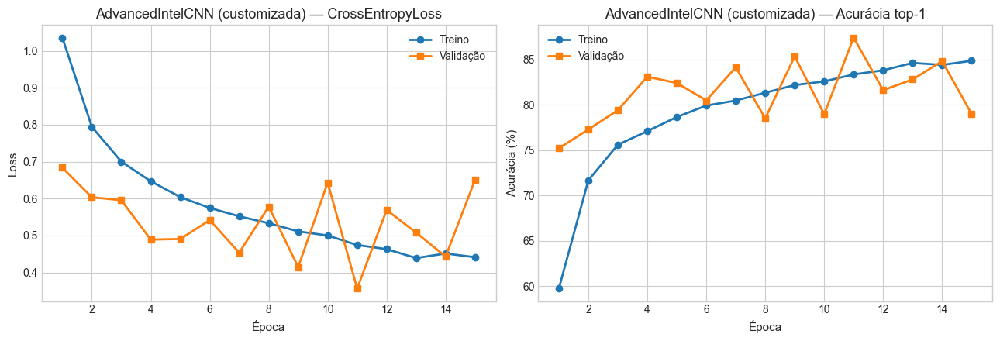

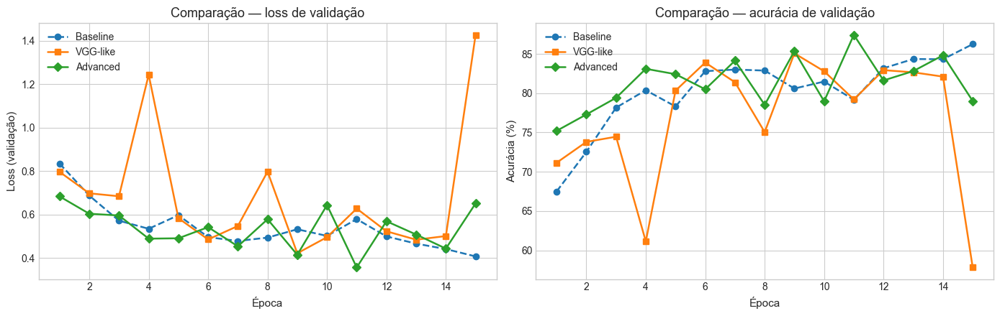

In [34]:
plot_training_history(history_advanced, title="AdvancedIntelCNN (customizada)")


def plot_three_models_comparison(h_a, h_b, h_c, names):
    epochs = range(1, len(h_a["train_loss"]) + 1)
    fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))
    for h, name, style in zip(
        [h_a, h_b, h_c], names, ["o--", "s-", "D-"]
    ):
        axes[0].plot(epochs, h["val_loss"], style, label=name, linewidth=1.8)
        axes[1].plot(epochs, h["val_acc"], style, label=name, linewidth=1.8)
    axes[0].set_xlabel("Época")
    axes[0].set_ylabel("Loss (validação)")
    axes[0].set_title("Comparação — loss de validação")
    axes[0].legend()
    axes[1].set_xlabel("Época")
    axes[1].set_ylabel("Acurácia (%)")
    axes[1].set_title("Comparação — acurácia de validação")
    axes[1].legend()
    plt.tight_layout()
    plt.show()


plot_three_models_comparison(
    history_baseline,
    history_vgg,
    history_advanced,
    ["Baseline", "VGG-like", "Advanced"],
)


### 6.5 Avaliação — treino, validação e teste

In [35]:
print("=" * 55)
print("Avaliação final — AdvancedIntelCNN")
print("=" * 55)

advanced_metrics = {}
advanced_metrics["train"] = evaluate_split(
    advanced_model, train_eval_loader, criterion, device, "Treino"
)
advanced_metrics["val"] = evaluate_split(
    advanced_model, val_loader, criterion, device, "Validação"
)
advanced_metrics["test"] = evaluate_split(
    advanced_model, test_loader, criterion, device, "Teste"
)

if device == "cuda":
    torch.cuda.empty_cache()


Avaliação final — AdvancedIntelCNN
Treino       | loss: 0.3994 | acurácia: 86.00%
Validação    | loss: 0.3564 | acurácia: 87.42%
Teste        | loss: 0.3657 | acurácia: 87.30%


### 6.6 Comparação quantitativa — três arquiteturas

Modelo          Val %    Test %     Parâmetros
------------------------------------------------
Baseline       86.24    85.84     10,711,878
VGG-like       85.07    84.14      4,822,086
Advanced       87.42    87.30     14,360,390


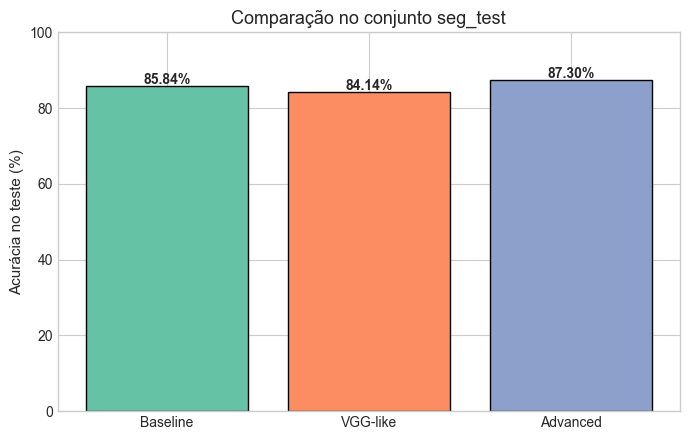

In [36]:
print(f"{'Modelo':<12} {'Val %':>8} {'Test %':>9} {'Parâmetros':>14}")
print("-" * 48)
for label, metrics, npar in [
    ("Baseline", baseline_metrics, n_params_baseline),
    ("VGG-like", vgg_metrics, n_params_vgg),
    ("Advanced", advanced_metrics, n_params_advanced),
]:
    print(f"{label:<12} {metrics['val'][1]:>7.2f} {metrics['test'][1]:>8.2f} {npar:>14,}")

fig, ax = plt.subplots(figsize=(7, 4.5))
models_lbl = ["Baseline", "VGG-like", "Advanced"]
test_vals = [
    baseline_metrics["test"][1],
    vgg_metrics["test"][1],
    advanced_metrics["test"][1],
]
colors = ["#66c2a5", "#fc8d62", "#8da0cb"]
bars = ax.bar(models_lbl, test_vals, color=colors, edgecolor="black")
ax.set_ylabel("Acurácia no teste (%)")
ax.set_title("Comparação no conjunto seg_test")
ax.set_ylim(0, 100)
for bar, v in zip(bars, test_vals):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.6,
            f"{v:.2f}%", ha="center", fontweight="bold")
plt.tight_layout()
plt.show()


## 7 — Comparando os três modelos

Sem treinar de novo: montamos a tabela `df_comparison` e os gráficos com o que já saiu das Fases 4–6.


### 7.1 Montagem da tabela comparativa

In [37]:
import pandas as pd

# Registro consolidado (sem retreino)
COMPARISON_REGISTRY = [
    {
        "modelo": "Baseline",
        "profundidade": "Baixa (~3 conv)",
        "parametros": n_params_baseline,
        "metrics": baseline_metrics,
        "history": history_baseline,
    },
    {
        "modelo": "VGG-like",
        "profundidade": "Média (~8 conv)",
        "parametros": n_params_vgg,
        "metrics": vgg_metrics,
        "history": history_vgg,
    },
    {
        "modelo": "Advanced",
        "profundidade": "Alta (stem + VGG + residual)",
        "parametros": n_params_advanced,
        "metrics": advanced_metrics,
        "history": history_advanced,
    },
]

rows = []
for entry in COMPARISON_REGISTRY:
    m = entry["metrics"]
    h = entry["history"]
    gap_tv = m["train"][1] - m["val"][1]
    gap_vtest = m["val"][1] - m["test"][1]
    rows.append({
        "Modelo": entry["modelo"],
        "Profundidade": entry["profundidade"],
        "Parâmetros": entry["parametros"],
        "Acc. Validação (%)": round(m["val"][1], 2),
        "Acc. Teste (%)": round(m["test"][1], 2),
        "Loss Teste": round(m["test"][0], 4),
        "Acc. Treino (%)": round(m["train"][1], 2),
        "Gap Treino−Val (p.p.)": round(gap_tv, 2),
        "Gap Val−Teste (p.p.)": round(gap_vtest, 2),
        "Val Loss (últ. época)": round(h["val_loss"][-1], 4),
    })

df_comparison = pd.DataFrame(rows)
df_comparison = df_comparison.sort_values("Acc. Teste (%)", ascending=False)

print("Tabela comparativa — modelos treinados (Fases 4–6)")
print("=" * 100)
print(df_comparison.to_string(index=False))
print("=" * 100)

# Índices para análise automática
idx_best_test = df_comparison["Acc. Teste (%)"].idxmax()
idx_best_val = df_comparison["Acc. Validação (%)"].idxmax()
idx_most_overfit = df_comparison["Gap Treino−Val (p.p.)"].idxmax()
idx_best_gen = df_comparison["Gap Val−Teste (p.p.)"].abs().idxmin()

comparison_insights = {
    "melhor_teste": df_comparison.loc[idx_best_test, "Modelo"],
    "melhor_val": df_comparison.loc[idx_best_val, "Modelo"],
    "maior_overfitting": df_comparison.loc[idx_most_overfit, "Modelo"],
    "melhor_generalizacao_val_teste": df_comparison.loc[idx_best_gen, "Modelo"],
}
print("\nResumo automático:")
for k, v in comparison_insights.items():
    print(f"  {k}: {v}")


Tabela comparativa — modelos treinados (Fases 4–6)
  Modelo                 Profundidade  Parâmetros  Acc. Validação (%)  Acc. Teste (%)  Loss Teste  Acc. Treino (%)  Gap Treino−Val (p.p.)  Gap Val−Teste (p.p.)  Val Loss (últ. época)
Advanced Alta (stem + VGG + residual)    14360390               87.42           87.30      0.3657            86.00                  -1.42                  0.12                 0.6511
Baseline              Baixa (~3 conv)    10711878               86.24           85.84      0.4161            86.03                  -0.21                  0.40                 0.4072
VGG-like              Média (~8 conv)     4822086               85.07           84.14      0.4296            85.26                   0.19                  0.92                 1.4271

Resumo automático:
  melhor_teste: Advanced
  melhor_val: Advanced
  maior_overfitting: VGG-like
  melhor_generalizacao_val_teste: Advanced


### 7.2 Gráficos comparativos

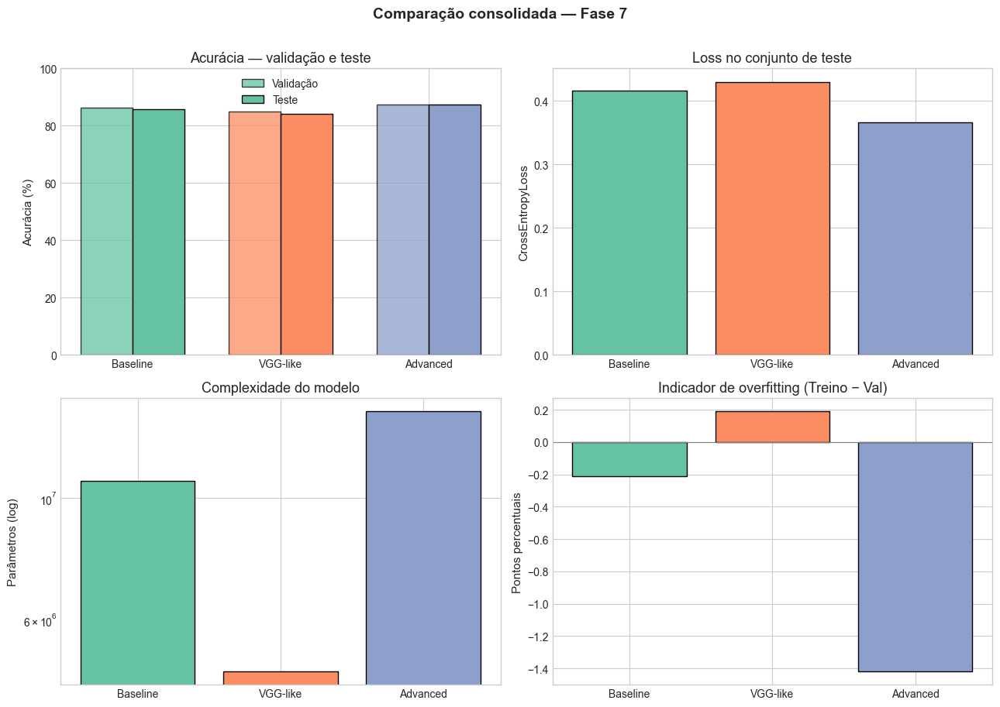

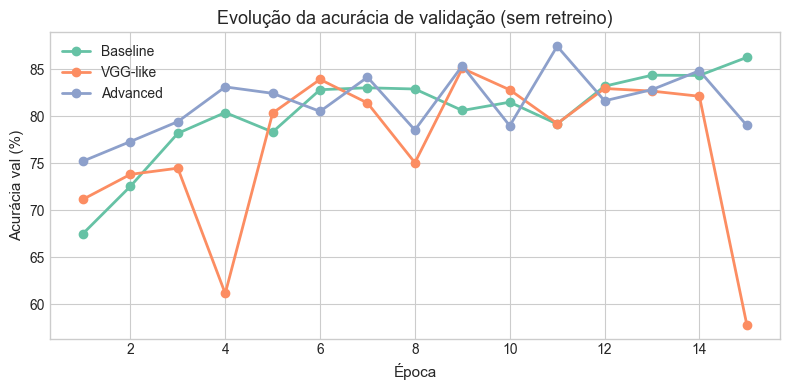

In [38]:
models_order = ["Baseline", "VGG-like", "Advanced"]
df_plot = df_comparison.set_index("Modelo").loc[models_order].reset_index()

colors = ["#66c2a5", "#fc8d62", "#8da0cb"]
x = np.arange(len(models_order))
width = 0.35

fig, axes = plt.subplots(2, 2, figsize=(13, 9))

# (1) Acurácia validação vs teste
ax = axes[0, 0]
ax.bar(x - width / 2, df_plot["Acc. Validação (%)"], width, label="Validação", color=colors, alpha=0.75, edgecolor="black")
ax.bar(x + width / 2, df_plot["Acc. Teste (%)"], width, label="Teste", color=colors, edgecolor="black")
ax.set_xticks(x)
ax.set_xticklabels(models_order)
ax.set_ylabel("Acurácia (%)")
ax.set_title("Acurácia — validação e teste")
ax.legend()
ax.set_ylim(0, 100)

# (2) Loss no teste
ax = axes[0, 1]
ax.bar(models_order, df_plot["Loss Teste"], color=colors, edgecolor="black")
ax.set_ylabel("CrossEntropyLoss")
ax.set_title("Loss no conjunto de teste")

# (3) Parâmetros (escala log)
ax = axes[1, 0]
ax.bar(models_order, df_plot["Parâmetros"], color=colors, edgecolor="black")
ax.set_yscale("log")
ax.set_ylabel("Parâmetros (log)")
ax.set_title("Complexidade do modelo")

# (4) Gap treino − validação (overfitting)
ax = axes[1, 1]
bars = ax.bar(models_order, df_plot["Gap Treino−Val (p.p.)"], color=colors, edgecolor="black")
ax.set_ylabel("Pontos percentuais")
ax.set_title("Indicador de overfitting (Treino − Val)")
ax.axhline(0, color="gray", linewidth=0.8)

plt.suptitle("Comparação consolidada — Fase 7", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

# Curvas finais de validação (históricos existentes)
fig, ax = plt.subplots(figsize=(8, 4))
for entry, color in zip(COMPARISON_REGISTRY, colors):
    h = entry["history"]
    epochs = range(1, len(h["val_acc"]) + 1)
    ax.plot(epochs, h["val_acc"], "o-", label=entry["modelo"], color=color, linewidth=2)
ax.set_xlabel("Época")
ax.set_ylabel("Acurácia val (%)")
ax.set_title("Evolução da acurácia de validação (sem retreino)")
ax.legend()
plt.tight_layout()
plt.show()


### 7.3 Resumo

A célula de código abaixo imprime qual modelo foi melhor no teste, qual pareceu mais overfit


In [39]:
def _row(model_name):
    return df_comparison[df_comparison["Modelo"] == model_name].iloc[0]


r_base, r_vgg, r_adv = _row("Baseline"), _row("VGG-like"), _row("Advanced")

print("=" * 70)
print("ANÁLISE TÉCNICA — FASE 7")
print("=" * 70)

print(f"\n1) Melhor desempenho no teste (generalização ao holdout): {comparison_insights['melhor_teste']}")
print(f"   → Acc. teste: {df_comparison['Acc. Teste (%)'].max():.2f}%")

print(f"2) Melhor acurácia em validação (seleção de checkpoint): {comparison_insights['melhor_val']}")

print(f"3) Menor desvio Val↔Teste (estabilidade entre splits): {comparison_insights['melhor_generalizacao_val_teste']}")
print("   (menor |Gap Val−Teste| indica que a métrica de val reflete bem o teste)")

print(f"4) Maior indício de overfitting (Gap Treino−Val): {comparison_insights['maior_overfitting']}")
print(f"   → Gap: {df_comparison['Gap Treino−Val (p.p.)'].max():.2f} p.p.")

print("\n5) Profundidade × desempenho:")
print(f"   Baseline  — params {int(r_base['Parâmetros']):,} | test {r_base['Acc. Teste (%)']:.2f}%")
print(f"   VGG-like  — params {int(r_vgg['Parâmetros']):,} | test {r_vgg['Acc. Teste (%)']:.2f}%")
print(f"   Advanced  — params {int(r_adv['Parâmetros']):,} | test {r_adv['Acc. Teste (%)']:.2f}%")
print("   Aumentar profundidade/capacidade tende a elevar a acurácia até um patamar")
print("   de saturação; ganhos marginais devem ser pesados contra custo GPU e risco de overfitting.")

if "training_time_vgg" in globals() and "training_time_advanced" in globals():
    print(f"\n6) Custo computacional (referência):")
    print(f"   Tempo treino VGG:      {training_time_vgg:.1f} s")
    print(f"   Tempo treino Advanced: {training_time_advanced:.1f} s")
print("\n" + "=" * 70)


ANÁLISE TÉCNICA — FASE 7

1) Melhor desempenho no teste (generalização ao holdout): Advanced
   → Acc. teste: 87.30%
2) Melhor acurácia em validação (seleção de checkpoint): Advanced
3) Menor desvio Val↔Teste (estabilidade entre splits): Advanced
   (menor |Gap Val−Teste| indica que a métrica de val reflete bem o teste)
4) Maior indício de overfitting (Gap Treino−Val): VGG-like
   → Gap: 0.19 p.p.

5) Profundidade × desempenho:
   Baseline  — params 10,711,878 | test 85.84%
   VGG-like  — params 4,822,086 | test 84.14%
   Advanced  — params 14,360,390 | test 87.30%
   Aumentar profundidade/capacidade tende a elevar a acurácia até um patamar
   de saturação; ganhos marginais devem ser pesados contra custo GPU e risco de overfitting.

6) Custo computacional (referência):
   Tempo treino VGG:      1022.5 s
   Tempo treino Advanced: 536.1 s



## 8 — Melhor modelo e erros

1. Escolhemos o modelo com melhor acurácia na **validação**.
2. Rodamos no teste e montamos a **matriz de confusão**.
3. Mostramos fotos que o modelo errou.


### 8.1 Escolha do modelo

Ganha quem tiver maior acurácia em val; em empate, vale quem for melhor no teste.


In [40]:
def _register_model(name: str, model_attr: str, metrics_attr: str) -> dict | None:
    """Registra candidato se modelo e métricas existirem na sessão."""
    if model_attr not in globals() or metrics_attr not in globals():
        return None
    metrics = globals()[metrics_attr]
    return {
        "name": name,
        "model": globals()[model_attr],
        "val_acc": metrics["val"][1],
        "test_acc": metrics["test"][1],
        "val_loss": metrics["val"][0],
    }


# Candidatos treinados nas fases anteriores (+ extensível para Fases 6–7)
_MODEL_CANDIDATES = [
    ("Baseline", "baseline_model", "baseline_metrics"),
    ("VGG-like", "vgg_model", "vgg_metrics"),
    ("Advanced", "advanced_model", "advanced_metrics"),
    ("Custom", "custom_model", "custom_metrics"),
]

registered = [
    c for spec in _MODEL_CANDIDATES
    if (c := _register_model(*spec)) is not None
]

if not registered:
    raise RuntimeError("Nenhum modelo treinado encontrado. Execute as Fases 4–6 antes.")

registered.sort(key=lambda x: (x["val_acc"], x["test_acc"]), reverse=True)
best_info = registered[0]
best_model = best_info["model"]
best_model_name = best_info["name"]

print("Ranking por acurácia de validação:")
print(f"{'Modelo':<14} {'Val acc':>10} {'Test acc':>10}")
print("-" * 36)
for c in registered:
    mark = " ← selecionado" if c["name"] == best_model_name else ""
    print(f"{c['name']:<14} {c['val_acc']:>9.2f}% {c['test_acc']:>9.2f}%{mark}")

print(f"\nMelhor modelo: {best_model_name} (val acc = {best_info['val_acc']:.2f}%)")
best_model.eval()

Ranking por acurácia de validação:
Modelo            Val acc   Test acc
------------------------------------
Advanced           87.42%     87.30% ← selecionado
Baseline           86.24%     85.84%
VGG-like           85.07%     84.14%

Melhor modelo: Advanced (val acc = 87.42%)


AdvancedIntelCNN(
  (stem): Sequential(
    (0): ConvBNAct(
      (net): Sequential(
        (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (stage2): VGGBlock(
    (net): Sequential(
      (0): ConvBNAct(
        (net): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
      (1): ConvBNAct(
        (net): Sequential(
          (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(in

### 8.2 Previsões no teste

Inferência em modo eval, sem gradiente.


In [41]:
@torch.no_grad()
def predict_loader(model: nn.Module, loader: DataLoader, device: str):
    """Retorna rótulos verdadeiros, previsões, probabilidades e erros com imagens."""
    model.eval()
    y_true_list, y_pred_list, y_prob_list = [], [], []
    misclassified = []

    for images, labels in loader:
        images_gpu = images.to(device, non_blocking=True)
        labels_cpu = labels.cpu()

        logits = model(images_gpu)
        probs = torch.softmax(logits, dim=1).cpu()
        preds = probs.argmax(dim=1)

        y_true_list.append(labels_cpu)
        y_pred_list.append(preds)
        y_prob_list.append(probs)

        wrong_mask = preds != labels_cpu
        if wrong_mask.any():
            images_vis = denormalize(images_gpu).cpu()
            for idx in torch.where(wrong_mask)[0]:
                misclassified.append({
                    "image": images_vis[idx],
                    "true_idx": int(labels_cpu[idx]),
                    "pred_idx": int(preds[idx]),
                    "confidence": float(probs[idx, preds[idx]]),
                })

    y_true = torch.cat(y_true_list)
    y_pred = torch.cat(y_pred_list)
    y_prob = torch.cat(y_prob_list)
    return y_true, y_pred, y_prob, misclassified


y_true_test, y_pred_test, y_prob_test, misclassified_samples = predict_loader(
    best_model, test_loader, device
)

test_acc_final = 100.0 * (y_true_test == y_pred_test).sum().item() / len(y_true_test)
n_errors = len(misclassified_samples)

print(f"Modelo: {best_model_name}")
print(f"Amostras no teste: {len(y_true_test):,}")
print(f"Acurácia no teste: {test_acc_final:.2f}%")
print(f"Erros de classificação: {n_errors:,} ({100 - test_acc_final:.2f}%)")

if device == "cuda":
    torch.cuda.empty_cache()

Modelo: Advanced
Amostras no teste: 3,000
Acurácia no teste: 87.33%
Erros de classificação: 380 (12.67%)


### 8.3 Matriz de confusão

<ipykernel>:11: UserWarning: 'where' used without 'out', expect unitialized memory in output. If this is intentional, use out=None.
  cm_normalized = np.divide(cm, row_sums, where=row_sums > 0)


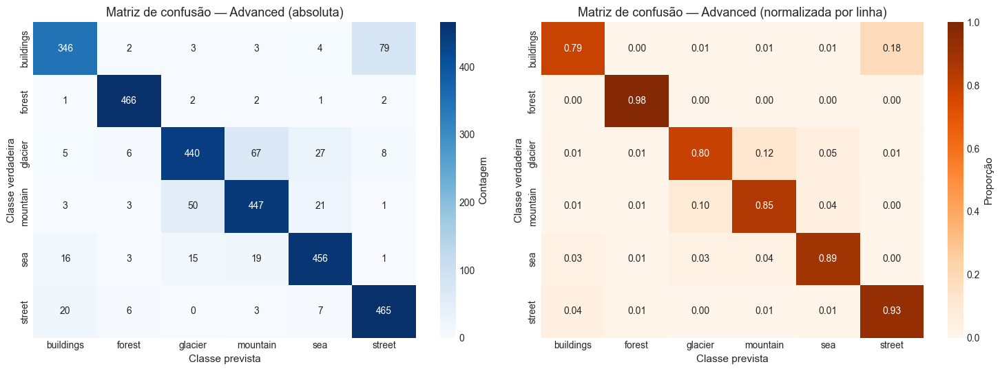

Relatório de classificação (teste):
              precision    recall  f1-score   support

   buildings      0.885     0.792     0.836       437
      forest      0.959     0.983     0.971       474
     glacier      0.863     0.796     0.828       553
    mountain      0.826     0.851     0.839       525
         sea      0.884     0.894     0.889       510
      street      0.836     0.928     0.880       501

    accuracy                          0.873      3000
   macro avg      0.875     0.874     0.874      3000
weighted avg      0.874     0.873     0.873      3000



In [42]:
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

cm = confusion_matrix(
    y_true_test.numpy(),
    y_pred_test.numpy(),
    labels=list(range(num_classes)),
)

row_sums = cm.sum(axis=1, keepdims=True)
cm_normalized = np.divide(cm, row_sums, where=row_sums > 0)

fig, axes = plt.subplots(1, 2, figsize=(15, 5.5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    ax=axes[0],
    cbar_kws={"label": "Contagem"},
)
axes[0].set_xlabel("Classe prevista")
axes[0].set_ylabel("Classe verdadeira")
axes[0].set_title(f"Matriz de confusão — {best_model_name} (absoluta)")

sns.heatmap(
    cm_normalized,
    annot=True,
    fmt=".2f",
    cmap="Oranges",
    xticklabels=class_names,
    yticklabels=class_names,
    ax=axes[1],
    vmin=0,
    vmax=1,
    cbar_kws={"label": "Proporção"},
)
axes[1].set_xlabel("Classe prevista")
axes[1].set_ylabel("Classe verdadeira")
axes[1].set_title(f"Matriz de confusão — {best_model_name} (normalizada por linha)")

plt.tight_layout()
plt.show()

print("Relatório de classificação (teste):")
print(classification_report(
    y_true_test.numpy(),
    y_pred_test.numpy(),
    target_names=class_names,
    digits=3,
))

### 8.4 Pares de confusão mais frequentes

In [43]:
def top_confusion_pairs(cm_matrix, class_labels, top_k: int = 8):
    """Lista os pares (verdadeiro → previsto) fora da diagonal com mais erros."""
    pairs = []
    for i in range(len(class_labels)):
        for j in range(len(class_labels)):
            if i != j and cm_matrix[i, j] > 0:
                pairs.append((cm_matrix[i, j], class_labels[i], class_labels[j]))
    pairs.sort(reverse=True)
    return pairs[:top_k]


top_pairs = top_confusion_pairs(cm, class_names)

print(f"Top {len(top_pairs)} confusões (verdadeiro → previsto):")
for count, true_cls, pred_cls in top_pairs:
    print(f"  {true_cls:12s} → {pred_cls:12s} : {count:3d} imagens")

Top 8 confusões (verdadeiro → previsto):
  buildings    → street       :  79 imagens
  glacier      → mountain     :  67 imagens
  mountain     → glacier      :  50 imagens
  glacier      → sea          :  27 imagens
  mountain     → sea          :  21 imagens
  street       → buildings    :  20 imagens
  sea          → mountain     :  19 imagens
  sea          → buildings    :  16 imagens


### 8.5 Imagens mal classificadas

Cada painel mostra a imagem (desnormalizada), a **classe correta** e a **classe prevista** pelo melhor modelo.

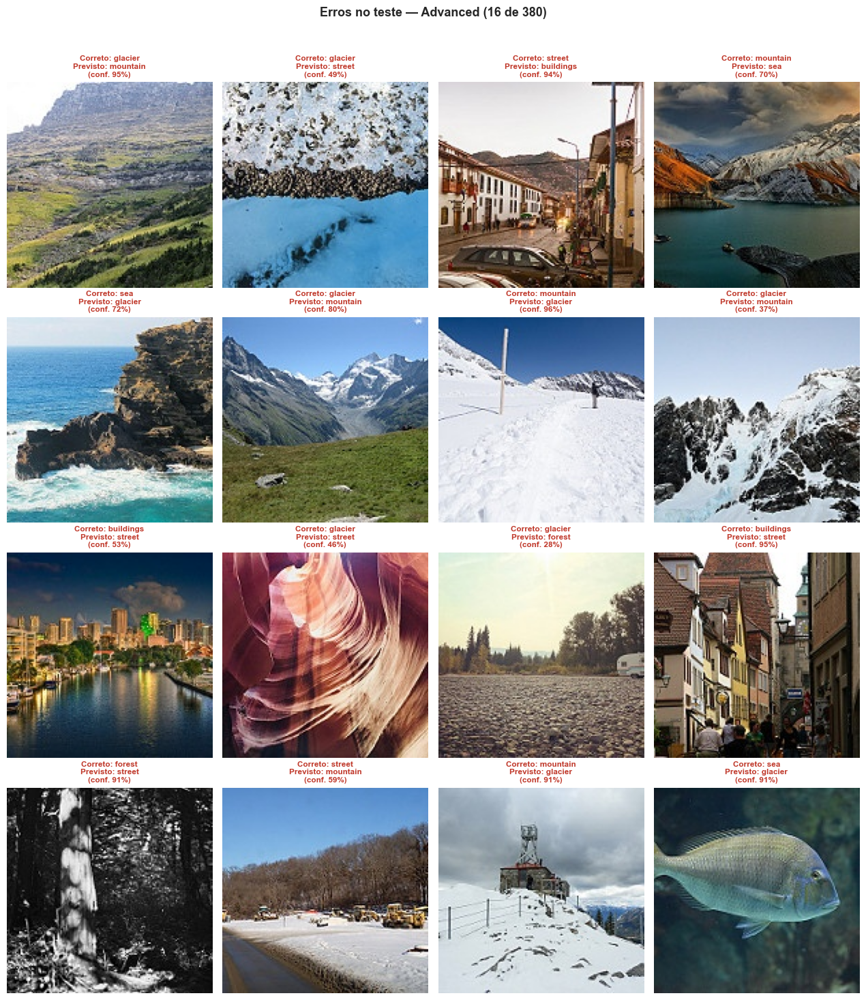

In [44]:
MAX_MISCLASSIFIED_SHOW = 16
NCOLS_MISCLASS = 4


def show_misclassified_grid(samples, title: str, max_show: int = MAX_MISCLASSIFIED_SHOW, ncols: int = NCOLS_MISCLASS):
    if not samples:
        print("Nenhum erro encontrado — classificação perfeita no teste.")
        return

    rng = random.Random(SEED)
    show_list = samples.copy()
    rng.shuffle(show_list)
    show_list = show_list[:max_show]

    n = len(show_list)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 3.2, nrows * 3.6))
    axes = np.atleast_2d(axes)

    for ax in axes.flat:
        ax.axis("off")

    for ax, sample in zip(axes.flat, show_list):
        img = sample["image"].permute(1, 2, 0).numpy()
        true_name = class_names[sample["true_idx"]]
        pred_name = class_names[sample["pred_idx"]]
        conf = sample["confidence"]

        ax.imshow(img)
        ax.set_title(
            f"Correto: {true_name}\nPrevisto: {pred_name}\n(conf. {conf:.0%})",
            fontsize=8.5,
            color="#c0392b",
            fontweight="bold",
        )

    fig.suptitle(title, fontsize=13, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.show()


show_misclassified_grid(
    misclassified_samples,
    title=f"Erros no teste — {best_model_name} ({min(MAX_MISCLASSIFIED_SHOW, len(misclassified_samples))} de {len(misclassified_samples)})",
)

### 8.6 Erros mais comuns

Na matriz e em `top_pairs`, costumam aparecer:

- **glacier / mountain / sea** — muito azul, branco e céu.
- **buildings / street** — cidade misturada no quadro.
- **buildings** — menos fotos no treino, às vezes pior recall.

Imagens pequenas (150×150) não guardam detalhe fino — parte do erro é esperada.



## 9 — Conclusão

Resumo do que rodou nas fases anteriores. Os números vêm das variáveis geradas no treino (`df_comparison`, `best_model_name`, etc.).


In [45]:
def _register_model_phase9(name: str, model_attr: str, metrics_attr: str) -> dict | None:
    if model_attr not in globals() or metrics_attr not in globals():
        return None
    metrics = globals()[metrics_attr]
    return {
        "name": name,
        "val_acc": metrics["val"][1],
        "test_acc": metrics["test"][1],
    }


if "registered" not in globals():
    registered = [
        c for spec in [
            ("Baseline", "baseline_model", "baseline_metrics"),
            ("VGG-like", "vgg_model", "vgg_metrics"),
            ("Advanced", "advanced_model", "advanced_metrics"),
            ("Custom", "custom_model", "custom_metrics"),
        ]
        if (c := _register_model_phase9(*spec)) is not None
    ]
    registered.sort(key=lambda x: (x["val_acc"], x["test_acc"]), reverse=True)


def _safe_metrics(name: str):
    """Recupera métricas e parâmetros se o modelo foi treinado."""
    mapping = {
        "Baseline": ("baseline_model", "baseline_metrics"),
        "VGG-like": ("vgg_model", "vgg_metrics"),
        "Advanced": ("advanced_model", "advanced_metrics"),
        "Custom": ("custom_model", "custom_metrics"),
    }
    if name not in mapping:
        return None
    model_key, metrics_key = mapping[name]
    if model_key not in globals() or metrics_key not in globals():
        return None
    return {
        "params": count_parameters(globals()[model_key]),
        "metrics": globals()[metrics_key],
    }


if not registered:
    raise RuntimeError("Execute as Fases 4–8 antes da conclusão.")

print("=" * 72)
print("SÍNTESE QUANTITATIVA DOS MODELOS")
print("=" * 72)
print(f"{'Modelo':<14} {'Val acc (%)':>12} {'Test acc (%)':>13} {'Parâmetros':>14}")
print("-" * 72)

for entry in registered:
    info = _safe_metrics(entry["name"])
    params = info["params"] if info else float("nan")
    print(
        f"{entry['name']:<14} {entry['val_acc']:>12.2f} {entry['test_acc']:>13.2f} {params:>14,}"
    )

print("-" * 72)
if "best_model_name" in globals():
    print(f"Modelo selecionado (critério: validação): {best_model_name}")
if "test_acc_final" in globals():
    print(f"Acurácia no teste (melhor modelo, reavaliação Fase 8): {test_acc_final:.2f}%")
if "n_params_baseline" in globals() and "n_params_vgg" in globals():
    print(f"Razão de parâmetros VGG / baseline: {n_params_vgg / n_params_baseline:.2f}×")
if "top_pairs" in globals() and top_pairs:
    print("\nPrincipais confusões no teste (verdadeiro → previsto):")
    for count, t_cls, p_cls in top_pairs[:5]:
        print(f"  • {t_cls} → {p_cls}: {count} ocorrências")
print("=" * 72)

SÍNTESE QUANTITATIVA DOS MODELOS
Modelo          Val acc (%)  Test acc (%)     Parâmetros
------------------------------------------------------------------------
Advanced              87.42         87.30     14,360,390
Baseline              86.24         85.84     10,711,878
VGG-like              85.07         84.14      4,822,086
------------------------------------------------------------------------
Modelo selecionado (critério: validação): Advanced
Acurácia no teste (melhor modelo, reavaliação Fase 8): 87.33%
Razão de parâmetros VGG / baseline: 0.45×

Principais confusões no teste (verdadeiro → previsto):
  • buildings → street: 79 ocorrências
  • glacier → mountain: 67 ocorrências
  • mountain → glacier: 50 ocorrências
  • glacier → sea: 27 ocorrências
  • mountain → sea: 21 ocorrências
